In [2]:
import pandas as pd
import numpy as np
from ast import literal_eval
from scipy.spatial.distance import cosine

# Построение графа

- Добавление контекстных векторов к вершинам
- Распределение по кластерам тех сущностей, которые не смогли сформировать полноценный кластер, на основе косинусного сходства с другими кластерами
- Апдейт ребер графа: вес = частота встречаемости сущностей * контекстное сходство сущностей

In [218]:
cl = pd.read_csv("clusters_of_disciplines.csv")
cl = cl["nodes"].to_dict()
for key, value in cl.items():
    cl[key] = literal_eval(value)

items = pd.read_csv("dataprocessing_items_202305252034.csv")
data = pd.read_csv("disc_contents20230506_4.csv")

In [219]:
cl_ent = []
for key, value in cl.items():
    cl_ent.extend(cl[key])

In [220]:
# количество сущностей на графе
len(cl_ent), len(set(cl_ent))

(15712, 15712)

In [221]:
# количество сущностей в бд
len(items.name.tolist()), len(set(items.name.tolist()))

(22195, 21692)

In [3]:
def eval_res(text):
    if isinstance(text, str):
        return literal_eval(text)
    # print(text)
    return []

In [223]:
# data["author_entities"] = data["author_entities"].apply(literal_eval)
data["extracted_entities"] = data["extracted_entities"].apply(eval_res)


In [224]:
data["author_entities"] = data["author_entities"].apply(literal_eval)
data.head()

,Unnamed: 0,id,discipline_code,title,qualification,description,work_status,section_topic,raw_text,author_entities,author_entities_n,extracted_entities,extracted_entities_n,combines_res,combined_res,res_n,comb_res,comb_res_n
0,0,2626,6183,Философия,bachelor,Курс «Философия» даёт целостное представление ...,w,Мышление и предметный мир. Мышление природы: о...,Философия. Курс «Философия» даёт целостное пре...,"[Ценности современного гуманизма, Системное мы...",11,"[Критическое мышление, Трансгуманизм, Проблема...",6.0,"['Ценности современного гуманизма', 'Системное...","['Ценности современного гуманизма', 'Системное...",10,"['Ценности современного гуманизма', 'Системное...",11
1,1,2627,10070,Введение в цифровую культуру и программирование,bachelor,"Курс ""Введение в цифровую культуру и программи...",w,Базовые инструменты разработки. Инструментарий...,Введение в цифровую культуру и программировани...,"[Цифровое образование, Цифровая этика, Техноло...",7,"[Управление ИТ разработкой, Цифровая культура,...",7.0,"['Цифровое образование', 'Цифровая этика', 'Те...","['Цифровое образование', 'Цифровая этика', 'Те...",10,"['Цифровое образование', 'Цифровая этика', 'Те...",14
2,2,2628,9334,Проектирование баз данных,bachelor,Дисциплина направлена на формирование понимани...,w,Введение. Основы баз данных. Первое знакомство...,Проектирование баз данных. Дисциплина направле...,"[Язык структурированных запросов (SQL), Хранен...",8,"[Проектирование баз данных, Базы данных, Реляц...",7.0,"['Язык структурированных запросов (SQL)', 'Хра...","['Язык структурированных запросов (SQL)', 'Хра...",10,"['Язык структурированных запросов (SQL)', 'Хра...",14
3,3,2631,6458,Современные вопросы информатики,bachelor,Дисциплина направлена на формирование системат...,w,БЧХ/РС коды. БЧХ/РС коды. Коды с малой плотнос...,Современные вопросы информатики. Дисциплина на...,"[Теория информации, Сверточные коды, Линейные ...",7,"[БЧХ/РС коды, Линейные коды, Сверточные коды, ...",6.0,"['Теория информации', 'Сверточные коды', 'Лине...","['Теория информации', 'Сверточные коды', 'Лине...",10,"['Теория информации', 'Сверточные коды', 'Лине...",10
4,4,2635,13873,Иностранный язык,bachelor,Целью освоения дисциплины является достижение ...,w,Иностранный язык для академических целей. Откр...,Иностранный язык. Целью освоения дисциплины яв...,[Типология языков],1,"[Иностранный язык, Письменная деловая коммуник...",4.0,"['Типология языков', 'Письменная деловая комму...","['Типология языков', 'Письменная деловая комму...",5,"['Типология языков', 'Письменная деловая комму...",5


In [225]:
items_from_data = []
for i in data.index.values:
    items_from_data.extend(data.author_entities[i])
    items_from_data.extend(data.extracted_entities[i])

In [226]:
len(items_from_data), len(set(items_from_data))

(105523, 16330)

In [227]:
print(len(set(items_from_data).intersection(items.name.tolist(),cl_ent)))
print(len(set(items_from_data).intersection(items.name.tolist())))
print(len(set(items_from_data).intersection(cl_ent)))

12930
16330
12930


In [228]:
data.discipline_code.nunique(), data.id.nunique(), data.shape

(8359, 8365, (8365, 18))

In [229]:
outcomes = data[["id", "author_entities", "extracted_entities"]]
outcomes.head()

,id,author_entities,extracted_entities
0,2626,"[Ценности современного гуманизма, Системное мы...","[Критическое мышление, Трансгуманизм, Проблема..."
1,2627,"[Цифровое образование, Цифровая этика, Техноло...","[Управление ИТ разработкой, Цифровая культура,..."
2,2628,"[Язык структурированных запросов (SQL), Хранен...","[Проектирование баз данных, Базы данных, Реляц..."
3,2631,"[Теория информации, Сверточные коды, Линейные ...","[БЧХ/РС коды, Линейные коды, Сверточные коды, ..."
4,2635,[Типология языков],"[Иностранный язык, Письменная деловая коммуник..."


In [230]:
outcomes["entities"] = (outcomes["author_entities"] + outcomes["extracted_entities"]).apply(set)
outcomes.drop(columns=["author_entities", "extracted_entities"], inplace=True)
outcomes.head()

,id,entities
0,2626,"{Креативное мышление, Концепции субъекта и объ..."
1,2627,"{Цифровое образование, Процесс разработки ПО, ..."
2,2628,"{Реляционная модель данных (РМД), Системы упра..."
3,2631,"{Сверточные коды, Теория информации, Коды с ма..."
4,2635,"{Типология языков, Творческий процесс, Письмен..."


In [231]:
ents = outcomes.explode(column="entities")
ents["entities"] = ents["entities"].str.lower()
ents = pd.merge(ents, ents, on="id").drop_duplicates()
ents = ents[ents["entities_x"]!=ents["entities_y"]].reset_index(drop=True)
ents

,id,entities_x,entities_y
0,2626,креативное мышление,концепции субъекта и объекта мышления
1,2626,креативное мышление,социальная определенность мышления
2,2626,креативное мышление,основы этического суждения
3,2626,креативное мышление,критическое мышление
4,2626,креативное мышление,проблема достоверности
...,...,...,...
1233059,25146,моделирование объектов контроля и процедур изм...,концептуальное моделирование
1233060,25146,программное обеспечение,моделирование объектов контроля и процедур изм...
1233061,25146,программное обеспечение,концептуальное моделирование
1233062,25146,концептуальное моделирование,моделирование объектов контроля и процедур изм...


In [233]:
ents.query("entities_x == 'ценности современного гуманизма'")

,id,entities_x,entities_y
180,2626,ценности современного гуманизма,креативное мышление
181,2626,ценности современного гуманизма,концепции субъекта и объекта мышления
182,2626,ценности современного гуманизма,социальная определенность мышления
183,2626,ценности современного гуманизма,основы этического суждения
184,2626,ценности современного гуманизма,критическое мышление
...,...,...,...
1150541,23098,ценности современного гуманизма,"понятие рациональности: практики, критерии, гр..."
1150542,23098,ценности современного гуманизма,трансгуманизм
1150543,23098,ценности современного гуманизма,постгуманизм
1150544,23098,ценности современного гуманизма,концепция справедливого общества


In [234]:
pairs = ents.groupby(["entities_x", "entities_y"]).count()["id"].reset_index()
pairs[pairs.id > 1].sort_values(by="id", ascending=False)

,entities_x,entities_y,id
202598,машинное обучение,анализ данных,98
51974,анализ данных,машинное обучение,98
220545,методы машинного обучения,машинное обучение,91
203003,машинное обучение,методы машинного обучения,91
521337,язык программирования python,языки программирования,67
...,...,...,...
129078,имитационное моделирование,автоматизация технологической подготовки произ...,2
365364,распознавание речи,выделение акустических признаков,2
129082,имитационное моделирование,автоматизированные системы проектирования,2
365362,распознавание речи,биологические объекты,2


In [235]:
pairs = pairs.values.tolist()
set_of_pairs = set()
for word1, word2, weight in pairs:
    first, second = sorted([word1, word2])
    set_of_pairs.add((first, second, weight))
list_of_pairs = list(set_of_pairs)
print(len(list_of_pairs), list_of_pairs[:10])

264642 [('геометрия моделей биотканей', 'моделирование', 2), ('квазиньютоновские методы', 'метод градиентного спуска', 1), ('аддитивные технологии', 'показания функциональной безопасности', 1), ('классификация хранилищ природного газа', 'криогенные циклы', 1), ('оценка и индикаторы энергоэффективности', 'принципы устойчивого развития', 2), ('molecular docking', 'polymers', 1), ('согласование импеданса', 'теорема блоха', 2), ('конструирование оптических приборов', 'правила выполнения чертежей', 1), ('измерение спектров поглощения многокомпонентных растворов', 'оптическая спектрокопия наноструктур', 2), ('information security', 'mobile device vulnerabilities', 2)]


In [4]:
import networkx as nx

In [236]:


G = nx.Graph()
G.add_weighted_edges_from(list_of_pairs)

nx.write_gexf(G, 'outcomes_network_for_article.gexf')

In [237]:
print(G)
density = nx.density(G)
print("Network density:", density)
if nx.is_connected(G):
    print("Connectivity: True")
    print("Network diameter: ", nx.diameter(G))
else:
    print("Connectivity: False")

Graph with 16287 nodes and 264642 edges
Network density: 0.001995415028750114
Connectivity: False


In [5]:
from operator import itemgetter

In [238]:


degree_dict = dict(G.degree(G.nodes()))
nx.set_node_attributes(G, degree_dict, 'degree')
sorted_degree = sorted(degree_dict.items(), key=itemgetter(1), reverse=True)
print("Top 15 nodes by degree:")
sorted_degree[:15]

Top 15 nodes by degree:


[('системы управления', 1446),
 ('программное обеспечение', 1412),
 ('информационная система', 1244),
 ('технологический процесс', 1237),
 ('машинное обучение', 1165),
 ('принципы построения сапр', 1082),
 ('жизненный цикл', 1061),
 ('методы исследования', 1025),
 ('анализ данных', 1019),
 ('практические навыки', 965),
 ('математическое моделирование', 952),
 ('базы данных', 914),
 ('языки программирования', 861),
 ('математическая модель', 774),
 ('окружающая среда', 744)]

In [239]:
print("Calculating eigenvector centrality...")
eigenvector_dict = nx.eigenvector_centrality(G)
print("Eigenvector centrality...")
nx.set_node_attributes(G, eigenvector_dict, 'eigenvector')
print("Sorting...")
sorted_eigenvector = sorted(eigenvector_dict.items(), key=itemgetter(1), reverse=True)

print("Top 15 nodes by eigenvector centrality:")
sorted_eigenvector[:15]

Calculating eigenvector centrality...
Eigenvector centrality...
Sorting...
Top 15 nodes by eigenvector centrality:


[('программное обеспечение', 0.14683826853047324),
 ('машинное обучение', 0.14188440854646167),
 ('системы управления', 0.1347548068327276),
 ('информационная система', 0.1306066493761746),
 ('анализ данных', 0.1275805850482444),
 ('жизненный цикл', 0.11256800232675478),
 ('технологический процесс', 0.10852414398257808),
 ('математическое моделирование', 0.10745304719150026),
 ('языки программирования', 0.10675331736160572),
 ('базы данных', 0.10584645503547277),
 ('практические навыки', 0.1055287512604007),
 ('принципы построения сапр', 0.10455135431866205),
 ('обработка данных', 0.09933486709663543),
 ('искусственный интеллект', 0.09475770111345531),
 ('инструментальное средство unimod', 0.08964088288115214)]

In [6]:
from community import community_louvain

In [258]:


communities = community_louvain.best_partition(G)
print("Modularity:", community_louvain.modularity(communities, G))

nx.set_node_attributes(G, communities, 'modularity')

partition = {}
for k, v in communities.items():
    if v not in partition:
        partition[v] = {k}
    else:
        partition[v].add(k)

partition = list(partition.values())

nx.algorithms.community.partition_quality(G, partition)  # coverage and performance

Modularity: 0.6214112162838124


In [261]:
modularity = {}
for k, v in communities.items():
    if v not in modularity:
        modularity[v] = [k]
    else:
        modularity[v].append(k)

clusters = {}
cluster_entities = []
extra_entities = []
for k, v in modularity.items():
    if len(v) > 10:
        clusters[k] = v
        cluster_entities.extend(v)
        print(str(k), len(v), v[:10])
    else:
        extra_entities.extend(v)

38 1069 ['геометрия моделей биотканей', 'polymers', 'конструирование оптических приборов', 'измерение спектров поглощения многокомпонентных растворов', 'оптическая спектрокопия наноструктур', 'устойчивые резонаторы лазеров', 'рассеяние света', 'методы исследования', 'генерация гармоник', 'комбинационное рассеяние']
1 1862 ['моделирование', 'управление рид', 'поиск и обработка ошибок', 'процесс проектирования', 'модели жизненного цикла', 'архитектура unix-систем', 'стек mean', 'функции и типичная структура cms', 'описание таблиц, правил целостности и др.', 'технологии реляционных субд']
24 831 ['квазиньютоновские методы', 'метод градиентного спуска', 'динамическая система', 'методы оптимизации', 'сплетающие операторы', 'математическое моделирование', 'понятие близости', 'квадратичные формы', 'линейная алгебра', 'уравнение гамильтона-якоби']
5 1697 ['аддитивные технологии', 'классификация хранилищ природного газа', 'криогенные циклы', 'сбалансированное питание', 'химический состав сырья'

In [262]:
print(len(modularity), len(clusters))

50 23


In [7]:
import gensim.parsing.preprocessing as pp
import re
from pymystem3 import Mystem
m = Mystem()

In [8]:
def input_preprocessing(text):
    text = pp.strip_multiple_whitespaces(re.sub(r'[«»]', ""," ".join(pp.preprocess_string(text))))
    text = m.lemmatize(text)
    text = [val for val in text if not val.isspace()]
    return text

In [29]:
data["preprocessed"] = data.raw_text.apply(input_preprocessing)

In [9]:
from gensim.models import Word2Vec, KeyedVectors

In [30]:


%time model = Word2Vec(data.preprocessed.tolist(), min_count=1, vector_size=300, workers=4, window=10)

CPU times: user 20.2 s, sys: 191 ms, total: 20.4 s
Wall time: 5.83 s


In [31]:
model.save("w2v_rpd.bin")

In [32]:
model.wv.most_similar(["машинный", "обучение"])

[('глубокий', 0.7378783226013184),
 ('нейросетевой', 0.6773681044578552),
 ('подкрепление', 0.6746894121170044),
 ('дапа', 0.6398621797561646),
 ('нейросеть', 0.6314749121665955),
 ('нейронный', 0.6217942833900452),
 ('learn', 0.6205417513847351),
 ('инференс', 0.609992504119873),
 ('переобучение', 0.5959835648536682),
 ('тюнинг', 0.5955556035041809)]

In [10]:
def embed(tokens, w2v_model):
  vectors = [w2v_model.wv.get_vector(token) for token in tokens if token in w2v_model.wv.index_to_key]
  vec = np.mean(vectors, axis=0) if len(vectors) != 0 else np.array([0]*300)
  return vec

# vec1 = embed(input_preprocessing("машинное обучение"), model)
# vec2 = model.wv.get_vector("машинный")
# vec3 = model.wv.get_vector("обучение")

In [34]:
print(np.round(1-cosine(vec1, vec2), 3))
print(np.round(1-cosine(vec1, vec3), 3))
print(np.round(1-cosine(vec2, vec3), 3))

0.925
0.95
0.761


In [264]:
for k, v in clusters.items():
    clusters[k] = [v]

clusters_df = pd.DataFrame.from_dict(clusters).T.reset_index(drop=True)
clusters_df.columns = ["nodes"]

clusters_df["text"] = clusters_df.nodes.str.join(" ")
clusters_df["lemmas"] = clusters_df.text.apply(input_preprocessing)
clusters_df["embedding"] = clusters_df.lemmas.apply(lambda row: embed(row, model))
clusters_df

In [11]:
def get_similarity(vec1, vec2):
    return np.round(1-cosine(vec1, vec2), 3)

In [12]:
def most_similar_cluster(entity, cluster_embeds, graph_entities, w2v_model):
    if entity not in graph_entities:
        entity_vec = embed(input_preprocessing(entity), w2v_model)
        sim = [np.round(1-cosine(entity_vec, cl_emb), 3) for cl_emb in cluster_embeds]
        return np.argmax(np.array(sim)), np.max(sim)
    return None

In [269]:
print(extra_entities[50])
print(most_similar_cluster(extra_entities[50], clusters_df.embedding.tolist(), cluster_entities, model))

критерии микробиологических процессов в продуктах
(3, 0.754)


In [270]:
clusters_df.iloc[3].nodes

['аддитивные технологии',
 'классификация хранилищ природного газа',
 'криогенные циклы',
 'сбалансированное питание',
 'химический состав сырья',
 'клеточная теория',
 'технологический процесс',
 'технологическая практика',
 'экспериментальный подход',
 'микроорганизмы ржаных заквасок и теста',
 'схема производства',
 'инженерные расчеты в пищевых производствах',
 'экономика и организация предприятия',
 'расчет характеристик газоперекачивающих агрегатов',
 'технологические схемы',
 'инженерный анализ',
 'основные технологии cad/cam/cae/pdm',
 'производственный процесс',
 'волновой процесс',
 'тепловой расчет',
 'пищевое сырье',
 'маркировка пищевой продукции',
 'методология оценки безопасности пищевых продуктов',
 'корректировка технологического процесса с целью устранения причин  возможного нарушения качества продукции производства с составлением документации для совершенствования и корректировки технологического процесса',
 'принципиальное отличие в гидродинамике ньютоновских и нень

In [271]:
for ent in extra_entities:
    cluster, _ = most_similar_cluster(ent, clusters_df.embedding.tolist(), cluster_entities, model)
    clusters_df.iloc[cluster]["nodes"] = clusters_df.iloc[cluster]["nodes"].append(ent)

In [272]:
for ent in items.name.tolist():
    ent = ent.lower()
    res = most_similar_cluster(ent, clusters_df.embedding.tolist(), cluster_entities, model)
    if res is not None:
        clusters_df.iloc[res[0]]["nodes"] = clusters_df.iloc[res[0]]["nodes"].append(ent)

In [273]:
for ent in set(items_from_data):
    ent = ent.lower()
    res = most_similar_cluster(ent, clusters_df.embedding.tolist(), cluster_entities, model)
    if res is not None:
        clusters_df.iloc[res[0]]["nodes"] = clusters_df.iloc[res[0]]["nodes"].append(ent)

In [274]:
clusters_df["nodes"] = clusters_df.nodes.apply(lambda value: list(set(value)))
clusters_df

,nodes,text,lemmas,embedding
0,"[светодиодная техника, квантовая точка, can, р...",геометрия моделей биотканей polymers конструир...,"[геометрия, модель, биоткань, polym, конструир...","[-0.80296546, -0.34380898, -0.44560263, 0.1290..."
1,"[язык vba, современный ко-дизайн вс на основе ...",моделирование управление рид поиск и обработка...,"[моделирование, управление, рид, поиск, обрабо...","[-0.2518791, 0.12731293, -0.7753818, -0.154678..."
2,"[фемтотехнологии, методы линейного программиро...",квазиньютоновские методы метод градиентного сп...,"[квазиньютоновский, метод, метод, градиентный,...","[-0.537719, 0.16996254, -0.59571546, 0.2323454..."
3,"[химико-технологический процесс (хтп), интегра...",аддитивные технологии классификация хранилищ п...,"[аддитивный, технология, классификация, хранил...","[-0.3000501, -0.20978601, -0.66379863, 0.03494..."
4,"[криптографическая подсистема, сверточные коды...",показания функциональной безопасности обеспече...,"[показание, функциональный, безопасность, обес...","[-0.02968703, -0.043660358, -0.7864964, 0.0170..."
5,"[типовой процесс выполнения заказа, выявление ...",оценка и индикаторы энергоэффективности принци...,"[оценка, индикатор, энергоэффективность, принц...","[-0.075734, 0.062234312, -0.6400174, 0.0244491..."
6,"[template synthesis, product quality managemen...",molecular docking information security mobile ...,"[molecular, dock, inform, secur, mobil, devic,...","[0.34283075, 0.47102696, 0.14266324, 0.0164515..."
7,"[основные уравнения электродинамики, релаксаци...",согласование импеданса теорема блоха квантовые...,"[согласование, импеданс, теорема, блоха, квант...","[-0.8356331, -0.16467878, -0.2225003, 0.276191..."
8,"[работа с манипуляторами, предпечатная подгото...",правила выполнения чертежей восприятие цвета о...,"[правило, выполнение, чертеж, восприятие, цвет...","[-0.4920428, -0.20263158, -0.6949571, 0.006890..."
9,"[нормальная форма хомского, графические формат...",data-driven подход глубокое обучение виды реко...,"[data, driven, подход, глубокий, обучение, вид...","[-0.28282708, 0.09819784, -0.7841827, 0.145066..."


In [275]:
all_entities = []
for ent in clusters_df.nodes.tolist():
    all_entities.extend(ent)

len(set(all_entities))

21627

In [276]:
clusters_df.to_csv("clusters.csv")

In [277]:
clusters_df["n_entities"] = clusters_df.nodes.apply(len)

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")
sns.set_context("talk")

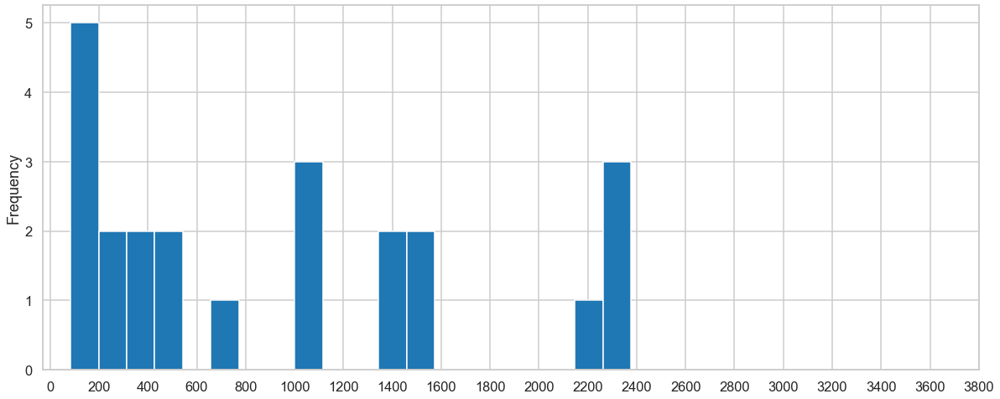

In [281]:


clusters_df.n_entities.plot(kind="hist", figsize=(20,8), xticks=range(0,4000,200), bins=20);

Большинство кластеров содержат около 100 сущностей.

In [282]:
len(model.wv.index_to_key)

30361

In [283]:
len(G.nodes)

16287

In [284]:
node_embedding = dict.fromkeys(G.nodes)
for node in node_embedding:
    node_embedding[node] = embed(input_preprocessing(node), model)

node_embedding

{'геометрия моделей биотканей': array([-1.031102  , -0.29842144, -0.4190569 ,  0.06121392,  0.32886553,
        -0.03009669,  0.9853565 ,  0.48520064,  0.3247121 ,  0.47069064,
         0.6939001 , -0.59730214, -0.34005377,  0.41378406, -0.10252631,
        -0.25667363,  0.837776  , -0.3398126 ,  0.35370603,  0.40940753,
         0.35799518,  0.15038684, -0.24627651,  0.2743132 ,  0.29734376,
        -0.35982737,  0.5844942 ,  0.9826133 ,  0.8118431 , -0.12915073,
         0.5141149 ,  0.2401535 , -0.75172806,  0.53449017,  0.11653873,
        -0.8537391 ,  1.2553192 , -0.31207708,  0.8919503 , -0.5696881 ,
        -0.31597742, -0.20213993, -0.39593384,  0.5171421 , -0.24234931,
        -0.2834949 ,  0.1736771 ,  0.26154754,  0.59273815, -0.9214694 ,
        -0.3472823 , -0.48516878,  0.30539963, -0.27018854, -0.39145827,
        -0.17362957,  0.05571405, -0.03537036,  0.6776781 ,  0.5161879 ,
        -0.24992912, -0.5521578 , -0.17672332, -0.6653502 , -0.62127185,
        -0.49071074,

In [285]:
nx.set_node_attributes(G, node_embedding, "embedding")

In [287]:
print(*G.neighbors('программные компоненты'))

проектирование системной архитектуры абстрагирование программной логики от бд типы данных и метаданные 1с функциональная архитектура архитектура по облачная архитектура ис сервис-ориентированная архитектура языки программирования для web-разработки риски мероприятия и методы реагирования анализ и проектирование на uml процесс разработки по оценка информационной безопасности информационный объект аппаратное обеспечение логическое проектирование бд объект управления особенности android киберустойчивые системы сборка прикладных пакетов из исходного кода системы искусственного интеллекта проектирование информационных систем жизненный цикл по базы данных системы менеджмента интеллектуальные системы программная архитектура 1с виды системных архитектур ис сложные системы устойчивость системы уровни информационной безопасности программное обеспечение композитное приложение инструменты автоматизации управления алгоритмы и структуры данных язык моделирования uml искусственный интеллект архитекту

In [288]:
for e in G.edges(data=True):
    print(e)
    break

('геометрия моделей биотканей', 'моделирование', {'weight': 2})


In [289]:
for n in G.nodes(data=True):
    print(n[1]["embedding"])
    break

[-1.031102   -0.29842144 -0.4190569   0.06121392  0.32886553 -0.03009669
  0.9853565   0.48520064  0.3247121   0.47069064  0.6939001  -0.59730214
 -0.34005377  0.41378406 -0.10252631 -0.25667363  0.837776   -0.3398126
  0.35370603  0.40940753  0.35799518  0.15038684 -0.24627651  0.2743132
  0.29734376 -0.35982737  0.5844942   0.9826133   0.8118431  -0.12915073
  0.5141149   0.2401535  -0.75172806  0.53449017  0.11653873 -0.8537391
  1.2553192  -0.31207708  0.8919503  -0.5696881  -0.31597742 -0.20213993
 -0.39593384  0.5171421  -0.24234931 -0.2834949   0.1736771   0.26154754
  0.59273815 -0.9214694  -0.3472823  -0.48516878  0.30539963 -0.27018854
 -0.39145827 -0.17362957  0.05571405 -0.03537036  0.6776781   0.5161879
 -0.24992912 -0.5521578  -0.17672332 -0.6653502  -0.62127185 -0.49071074
 -0.37418735 -0.3475187   0.3358073  -0.7644839  -0.33686402  0.31946683
 -0.06568072 -0.9261072  -0.12693368 -0.54220086 -0.7209982  -0.7940634
 -0.31293407 -0.0484127  -0.46038666 -0.4170877   0.2226

In [290]:
edge_similarity = dict.fromkeys(G.edges)
for edge in edge_similarity:
    edge_similarity[edge] = get_similarity(node_embedding[edge[0]], node_embedding[edge[1]])

edge_similarity

{('геометрия моделей биотканей', 'моделирование'): 0.582,
 ('геометрия моделей биотканей', 'перенос излучения'): 0.391,
 ('геометрия моделей биотканей', 'сетевое взаимодействие'): 0.247,
 ('геометрия моделей биотканей', 'мутные среды'): 0.37,
 ('геометрия моделей биотканей',
  'оптические и теплофизические параметры биотканей'): 0.502,
 ('геометрия моделей биотканей', 'понятие модели'): 0.757,
 ('геометрия моделей биотканей', 'уравнение теплопроводности'): 0.384,
 ('геометрия моделей биотканей', 'распространение лазерного излучения'): 0.412,
 ('геометрия моделей биотканей', 'компьютерное моделирование'): 0.572,
 ('геометрия моделей биотканей', 'терморегуляция живых организмов'): 0.073,
 ('геометрия моделей биотканей', 'лазерная обработка биотканей'): 0.297,
 ('геометрия моделей биотканей', 'концепция селективного фототермолиза'): 0.15,
 ('геометрия моделей биотканей', 'метод монте-карло'): 0.476,
 ('геометрия моделей биотканей', 'воздействие лазерного излучения'): 0.385,
 ('геометрия м

In [291]:
nx.set_edge_attributes(G, edge_similarity, "similarity")

In [292]:
edge_importance = dict.fromkeys(G.edges)
for edge in G.edges(data=True):
    edge_importance[(edge[0], edge[1])] = edge[2]["weight"]*edge[2]["similarity"]

edge_importance

{('геометрия моделей биотканей', 'моделирование'): 1.164,
 ('геометрия моделей биотканей', 'перенос излучения'): 0.782,
 ('геометрия моделей биотканей', 'сетевое взаимодействие'): 0.494,
 ('геометрия моделей биотканей', 'мутные среды'): 0.74,
 ('геометрия моделей биотканей',
  'оптические и теплофизические параметры биотканей'): 1.004,
 ('геометрия моделей биотканей', 'понятие модели'): 1.514,
 ('геометрия моделей биотканей', 'уравнение теплопроводности'): 0.768,
 ('геометрия моделей биотканей', 'распространение лазерного излучения'): 0.824,
 ('геометрия моделей биотканей', 'компьютерное моделирование'): 1.144,
 ('геометрия моделей биотканей', 'терморегуляция живых организмов'): 0.146,
 ('геометрия моделей биотканей', 'лазерная обработка биотканей'): 0.594,
 ('геометрия моделей биотканей', 'концепция селективного фототермолиза'): 0.3,
 ('геометрия моделей биотканей', 'метод монте-карло'): 0.952,
 ('геометрия моделей биотканей', 'воздействие лазерного излучения'): 0.77,
 ('геометрия мод

In [293]:
nx.set_edge_attributes(G, edge_importance, "importance")

In [294]:
for e in G.edges(data=True):
    print(e)
    break

('геометрия моделей биотканей', 'моделирование', {'weight': 2, 'similarity': 0.582, 'importance': 1.164})


In [295]:
G1 = G.copy()

for node in G1.nodes(data=True):
    node[1].pop("embedding")

G1.nodes(data=True)

NodeDataView({'геометрия моделей биотканей': {'degree': 17, 'eigenvector': 0.00197974463315724, 'modularity': 38}, 'моделирование': {'degree': 254, 'eigenvector': 0.044678750942643716, 'modularity': 1}, 'квазиньютоновские методы': {'degree': 17, 'eigenvector': 0.0020031959404374945, 'modularity': 24}, 'метод градиентного спуска': {'degree': 68, 'eigenvector': 0.012267396137043505, 'modularity': 24}, 'аддитивные технологии': {'degree': 120, 'eigenvector': 0.016241383003297884, 'modularity': 5}, 'показания функциональной безопасности': {'degree': 52, 'eigenvector': 0.007340396218269131, 'modularity': 17}, 'классификация хранилищ природного газа': {'degree': 18, 'eigenvector': 0.0006060362431888122, 'modularity': 5}, 'криогенные циклы': {'degree': 45, 'eigenvector': 0.002503856763947861, 'modularity': 5}, 'оценка и индикаторы энергоэффективности': {'degree': 11, 'eigenvector': 0.0007971361661149328, 'modularity': 27}, 'принципы устойчивого развития': {'degree': 77, 'eigenvector': 0.007232

In [296]:
nx.write_gexf(G1, 'outcomes_network_with_embedding_similarity.gexf')

# Апдейт связей графа

Разметка сущностей на графе по иерархии:
1. Извлечение сущностей отдельно из названия, разделов и тем
2. Разметка пар сущностей внутри одной дисциплины по иерархии (weight - это по умолчанию связь вида unknown)

In [297]:
df = pd.read_csv("df_up_courses_202308.csv")
df.head()

,Unnamed: 0,course_id,course_title,description,section,topic,qualification,unit_id,up_id,up_title,start_year,module_name
0,0,2811,Архитектура информационных систем,Целью освоения дисциплины «Архитектура информа...,Функциональная и информационная архитектуры,"Понятия ИС, КИС, АСУ, АСУП. ИС как инструмент ...",bachelor,14.0,6905,Программирование и интернет-технологии,2018,"Специализация ""Информационные системы и технол..."
1,1,2811,Архитектура информационных систем,Целью освоения дисциплины «Архитектура информа...,Функциональная и информационная архитектуры,"Понятия ИС, КИС, АСУ, АСУП. ИС как инструмент ...",bachelor,14.0,6938,Программирование и интернет-технологии,2019,"Специализация ""Информационные системы и технол..."
2,2,2811,Архитектура информационных систем,Целью освоения дисциплины «Архитектура информа...,Функциональная и информационная архитектуры,"Понятия ИС, КИС, АСУ, АСУП. ИС как инструмент ...",bachelor,14.0,7014,Программирование и интернет-технологии,2020,"Специализация ""Разработка информационных систе..."
3,54,2811,Архитектура информационных систем,Целью освоения дисциплины «Архитектура информа...,Функциональная и информационная архитектуры,Различные методики управления организацией,bachelor,14.0,6905,Программирование и интернет-технологии,2018,"Специализация ""Информационные системы и технол..."
4,55,2811,Архитектура информационных систем,Целью освоения дисциплины «Архитектура информа...,Функциональная и информационная архитектуры,Различные методики управления организацией,bachelor,14.0,6938,Программирование и интернет-технологии,2019,"Специализация ""Информационные системы и технол..."


In [14]:
import outcomes_extraction as ke
import difflib
import pymorphy2
import nltk
import razdel

In [83]:



items["lowercase"] = items.name.str.lower()


def get_entities(text, lower_case=False, entities_to_match=150):
    """Здесь сущности извлекаются из текста и памятся с сущностями из БД
    150 - это вообще слишком много, но так сущности берутся по максимуму, 
    отсюда примерно 3-6 секунд на выполнение извлечения
    Дальше то, что извлеклось, мапится с БД без ограничений по количеству"""
    
    example = ke.simple_outcomes_extraction(text, n_best=entities_to_match)
    res = pd.DataFrame(columns=["id", "name", "lowercase"])
    for word in example:
        close = difflib.get_close_matches(word, items.lowercase.tolist(), cutoff=0.85, n=1)
        if close:
            res = res.append(items[items.lowercase.isin(close)][["id", "name", "lowercase"]])
            res.drop_duplicates(subset=["lowercase"], inplace=True)
    if lower_case:
        return res.lowercase.tolist()
    return res.name.tolist()

In [84]:
get_entities("Архитектура информационных систем", lower_case=True)

['архитектура информационных систем']

In [85]:
get_entities("Архитектура информационных систем")

['Архитектура информационных систем']

In [87]:
df_titles = df[["course_title"]]
print(df_titles.shape)
df_titles.drop_duplicates(inplace=True, ignore_index=True)
print(df_titles.shape)
df_titles.head()


(1039709, 1)
(4070, 1)


/Users/ana_cher/.conda/envs/phd38/lib/python3.8/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


,course_title
0,Архитектура информационных систем
1,Основы академической коммуникации
2,Иностранный язык в профессиональной деятельности
3,Основы естественнонаучных процессов
4,Надежность технических систем


In [15]:
from tqdm import tqdm
from tqdm.auto import tqdm

tqdm.pandas()

/Users/ana_cher/.conda/envs/phd38/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [90]:
df_titles["title_entities"] = df_titles.course_title.progress_apply(get_entities, lower_case=True, entities_to_match=50)
df_titles.head()

100%|██████████| 4070/4070 [12:26<00:00,  5.45it/s]
<ipython-input-90-c2eb5ec00223>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_titles["title_entities"] = df_titles.course_title.progress_apply(get_entities, lower_case=True, entities_to_match=50)


,course_title,title_entities
0,Архитектура информационных систем,[архитектура информационных систем]
1,Основы академической коммуникации,[]
2,Иностранный язык в профессиональной деятельности,"[иностранный язык, профессиональная деятельнос..."
3,Основы естественнонаучных процессов,[]
4,Надежность технических систем,[расчет надежности технических систем]


In [91]:
df_section = df[["section"]]
print(df_section.shape)
df_section.drop_duplicates(inplace=True, ignore_index=True)
print(df_section.shape)
df_section.head()
df_section["title_entities"] = df_section.section.progress_apply(get_entities, lower_case=True, entities_to_match=50)
df_section.head()

/Users/ana_cher/.conda/envs/phd38/lib/python3.8/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


(1039709, 1)
(15142, 1)


100%|██████████| 15142/15142 [41:15<00:00,  6.12it/s] 
<ipython-input-91-7f1355d6215f>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_section["title_entities"] = df_section.section.progress_apply(get_entities, lower_case=True, entities_to_match=50)


,section,title_entities
0,Функциональная и информационная архитектуры,[информационная архитектура]
1,Системная и программная архитектура,[программная архитектура 1с]
2,Основы деловой переписки,[]
3,Основы публичной речи,[]
4,Академическое письмо,[академическое письмо]


In [95]:
df_section.columns = ["section", "section_entites"]
df_section.head()

,section,section_entites
0,Функциональная и информационная архитектуры,[информационная архитектура]
1,Системная и программная архитектура,[программная архитектура 1с]
2,Основы деловой переписки,[]
3,Основы публичной речи,[]
4,Академическое письмо,[академическое письмо]


In [92]:
df_topic = df[["topic"]]
print(df_topic.shape)
df_topic.drop_duplicates(inplace=True, ignore_index=True)
print(df_topic.shape)
df_topic.head()
df_topic["topic_entities"] = df_topic.topic.progress_apply(get_entities, lower_case=True, entities_to_match=50)
df_topic.head()

(1039709, 1)


/Users/ana_cher/.conda/envs/phd38/lib/python3.8/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


(56139, 1)


100%|██████████| 56139/56139 [3:38:46<00:00,  4.28it/s]      
<ipython-input-92-229b3102ff2e>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_topic["topic_entities"] = df_topic.topic.progress_apply(get_entities, lower_case=True, entities_to_match=50)


,topic,topic_entities
0,"Понятия ИС, КИС, АСУ, АСУП. ИС как инструмент ...",[инструменты автоматизации управления]
1,Различные методики управления организацией,"[управление организацией, методики управления ..."
2,"Связь методик управления и классов ИС, которые...",[]
3,"Понятие функции ИС, связь функций ИС и автомат...",[]
4,Функциональный модуль (подсистема) ИС,[]


In [94]:
df_res = pd.merge(df, df_titles, left_on="course_title", right_on="course_title")
df_res.shape, df.shape

((1039709, 13), (1039709, 12))

In [96]:
df_res_sections = pd.merge(df_res, df_section, left_on="section", right_on="section")
df_res_sections.shape, df.shape

((1039709, 14), (1039709, 12))

In [97]:
df_res_sections_topics = pd.merge(df_res_sections, df_topic, left_on="topic", right_on="topic")
df_res_sections_topics.shape, df_res_sections.shape

((1039709, 15), (1039709, 14))

In [98]:
df_res_sections_topics.head()

,Unnamed: 0,course_id,course_title,description,section,topic,qualification,unit_id,up_id,up_title,start_year,module_name,title_entities,section_entites,topic_entities
0,0,2811,Архитектура информационных систем,Целью освоения дисциплины «Архитектура информа...,Функциональная и информационная архитектуры,"Понятия ИС, КИС, АСУ, АСУП. ИС как инструмент ...",bachelor,14.0,6905,Программирование и интернет-технологии,2018,"Специализация ""Информационные системы и технол...",[архитектура информационных систем],[информационная архитектура],[инструменты автоматизации управления]
1,1,2811,Архитектура информационных систем,Целью освоения дисциплины «Архитектура информа...,Функциональная и информационная архитектуры,"Понятия ИС, КИС, АСУ, АСУП. ИС как инструмент ...",bachelor,14.0,6938,Программирование и интернет-технологии,2019,"Специализация ""Информационные системы и технол...",[архитектура информационных систем],[информационная архитектура],[инструменты автоматизации управления]
2,2,2811,Архитектура информационных систем,Целью освоения дисциплины «Архитектура информа...,Функциональная и информационная архитектуры,"Понятия ИС, КИС, АСУ, АСУП. ИС как инструмент ...",bachelor,14.0,7014,Программирование и интернет-технологии,2020,"Специализация ""Разработка информационных систе...",[архитектура информационных систем],[информационная архитектура],[инструменты автоматизации управления]
3,4765022,10533,Архитектура информационных систем,Целью освоения дисциплины «Архитектура информа...,Функциональная и информационная архитектуры,"Понятия ИС, КИС, АСУ, АСУП. ИС как инструмент ...",bachelor,14.0,7136,Информатика и программирование,2021,"Специализация ""Программирование""",[архитектура информационных систем],[информационная архитектура],[инструменты автоматизации управления]
4,7390506,22983,Архитектура информационных систем,Целью освоения дисциплины «Архитектура информа...,Функциональная и информационная архитектуры,"Понятия ИС, КИС, АСУ, АСУП. ИС как инструмент ...",bachelor,14.0,7229,Разработка программного обеспечения / Software...,2022,Разработка программного обеспечения и информац...,[архитектура информационных систем],[информационная архитектура],[инструменты автоматизации управления]


hierarchy: title -> section -> topic
```
{"is_supercategory": n,
 "is_subcategory": m,
 "same_level": k,
 "weight": p}  #unknown
 ```

In [16]:
import warnings

warnings.filterwarnings("ignore")

296
93
54
70
96
50
68


## Небольшое исследование связей на графе

In [427]:
df_edges = nx.to_pandas_edgelist(G)

In [535]:
df_edges.head()

,source,target,title_topic,topic_title,weight,same_level,importance,topic_section,similarity,section_title,title_section,section_topic
0,геометрия моделей биотканей,моделирование,0,0,2,0,1.164,0,0.582,0,0,0
1,геометрия моделей биотканей,перенос излучения,0,0,2,0,0.782,0,0.391,0,0,0
2,геометрия моделей биотканей,сетевое взаимодействие,0,0,2,0,0.494,0,0.247,0,0,0
3,геометрия моделей биотканей,мутные среды,0,0,2,0,0.740,0,0.370,0,0,0
4,геометрия моделей биотканей,оптические и теплофизические параметры биотканей,0,0,2,0,1.004,0,0.502,0,0,0


График значимости связи с учетом веса и сходства эмбеддингов

In [431]:
print(df_edges.query("importance < 1").shape)
print(df_edges.query("importance < 0.5").shape)
print(df_edges.importance.max())

(173100, 12)
(88739, 12)
85.631


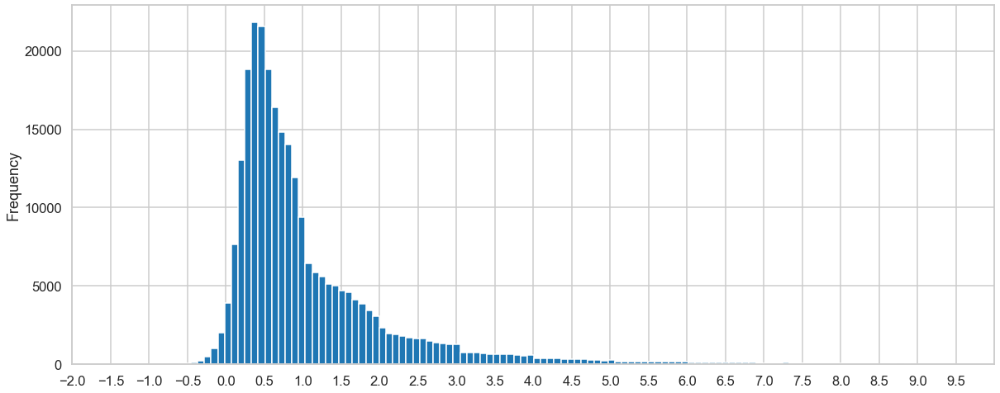

In [432]:
ax = df_edges.importance.plot(kind="hist", figsize=(20,8), xticks=np.arange(-2,10,0.5), bins=1000)
ax.set(xlim=(-2,10));

График сходства эмбеддингов сущностей

In [433]:
print(df_edges.query("similarity < 0.5 & similarity > 0").shape)
print(df_edges.query("similarity < 0").shape)

(148457, 12)
(4614, 12)


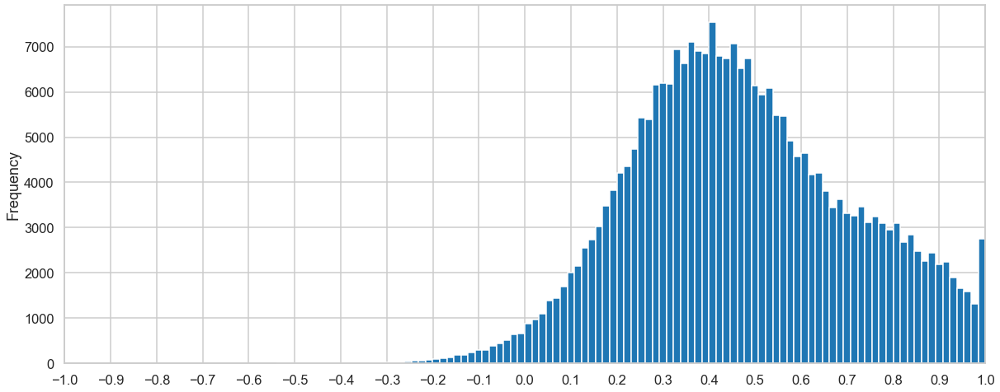

In [434]:
ax1 = df_edges.similarity.plot(kind="hist", figsize=(20,8), xticks=np.arange(-1,1.1,0.1), bins=100)
ax1.set(xlim=(-1,1));

График частоты встречаемости пар сущностей

In [435]:
print(df_edges.weight.max())
df_edges.query("weight <= 98 & weight > 12").shape

98


(1892, 12)

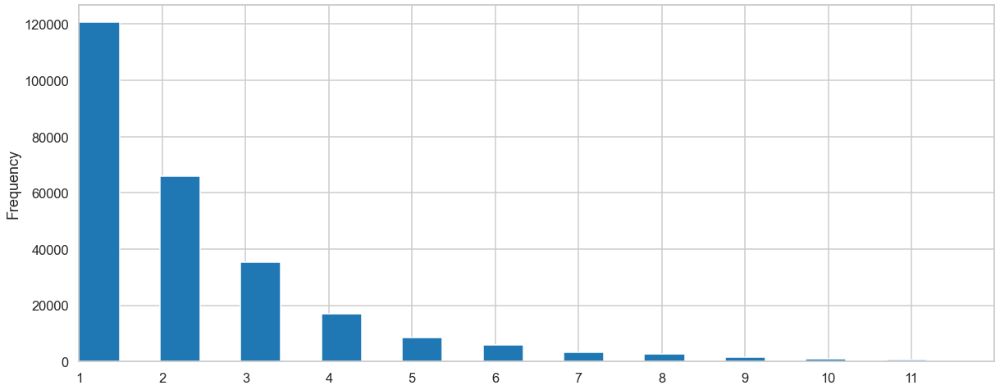

In [436]:
ax2 = df_edges.weight.plot(kind="hist", figsize=(20,8), xticks=np.arange(1, 12), bins=200)
ax2.set(xlim=(1,12));

Попробуем оценить виды связей

In [460]:
df_edges.head()

,source,target,title_topic,topic_title,weight,same_level,importance,topic_section,similarity,section_title,title_section,section_topic
0,геометрия моделей биотканей,моделирование,0,0,2,0,1.164,0,0.582,0,0,0
1,геометрия моделей биотканей,перенос излучения,0,0,2,0,0.782,0,0.391,0,0,0
2,геометрия моделей биотканей,сетевое взаимодействие,0,0,2,0,0.494,0,0.247,0,0,0
3,геометрия моделей биотканей,мутные среды,0,0,2,0,0.740,0,0.370,0,0,0
4,геометрия моделей биотканей,оптические и теплофизические параметры биотканей,0,0,2,0,1.004,0,0.502,0,0,0


In [470]:
df_edges[["weight", "similarity", "importance"]].agg({"mean", "median", "max", "min", "var", "std"})


,weight,similarity,importance
std,2.228658,0.238758,1.479378
max,98.000000,1.000000,85.631000
var,4.966917,0.057005,2.188560
min,1.000000,-0.539000,-1.854000
mean,2.329683,0.470544,1.139754
median,2.000000,0.451000,0.719000


In [475]:
df_edges[["same_level", "topic_section", 
          "section_topic", "title_section", 
          "section_title", "title_topic", "topic_title"]].replace(0,np.nan).agg({"mean", "median", "max", "min", "var", "std"})

,same_level,topic_section,section_topic,title_section,section_title,title_topic,topic_title
std,12.285684,2.227772,2.008318,5.998597,6.508014,2.302000,2.174727
max,296.000000,50.000000,70.000000,93.000000,96.000000,54.000000,68.000000
var,150.938021,4.962968,4.033340,35.983163,42.354250,5.299205,4.729438
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
mean,5.158200,1.928692,1.857362,5.374464,5.629893,1.855574,1.872416
median,2.000000,1.000000,1.000000,4.000000,4.000000,1.000000,1.000000


In [476]:
df_edges.loc[df_edges.same_level.idxmax()]

source           методы машинного обучения
target                   машинное обучение
title_topic                             10
topic_title                             11
weight                                  91
same_level                             296
importance                          85.631
topic_section                           12
similarity                           0.941
section_title                           23
title_section                           27
section_topic                           10
Name: 20833, dtype: object

In [477]:
df_edges.loc[df_edges.title_section.idxmax()]

source           математический анализ
target                 теория пределов
title_topic                          0
topic_title                          0
weight                              25
same_level                          20
importance                      10.075
topic_section                        0
similarity                       0.403
section_title                        0
title_section                       93
section_topic                        0
Name: 42121, dtype: object

In [478]:
df_edges.loc[df_edges.title_topic.idxmax()]

source                      системы менеджмента
target           безопасность пищевой продукции
title_topic                                  54
topic_title                                   0
weight                                        7
same_level                                  135
importance                                3.325
topic_section                                46
similarity                                0.475
section_title                                 6
title_section                                64
section_topic                                70
Name: 84018, dtype: object

In [480]:
df_edges.loc[df_edges.topic_section.idxmax()]

source                     безопасность пищевой продукции
target           системы менеджмента пищевой безопасности
title_topic                                             0
topic_title                                             0
weight                                                  6
same_level                                            106
importance                                           5.19
topic_section                                          50
similarity                                          0.865
section_title                                           0
title_section                                           6
section_topic                                          42
Name: 231091, dtype: object

In [482]:
df_edges.to_csv("marked_edges.csv")

In [485]:
df_edges.shape

(264642, 12)

In [486]:
non_zero_edges = df_edges.query("same_level!=0 | title_section!=0 | title_topic!=0 | section_topic!=0 | section_title!=0 | topic_section!=0 | topic_title!=0")
non_zero_edges.shape

(30063, 12)

In [536]:
non_zero_edges.head()

,source,target,title_topic,topic_title,weight,same_level,importance,topic_section,similarity,section_title,title_section,section_topic
8,геометрия моделей биотканей,компьютерное моделирование,0,1,2,0,1.144,0,0.572,0,0,0
13,геометрия моделей биотканей,воздействие лазерного излучения,0,1,2,0,0.770,1,0.385,0,0,0
14,геометрия моделей биотканей,лазерное излучение,0,1,2,0,0.674,1,0.337,0,0,0
17,моделирование,проектирование информационных систем,0,0,2,0,0.814,0,0.407,12,0,0
27,моделирование,инструментальное средство unimod,0,0,14,13,5.082,3,0.363,0,0,0


In [541]:
non_zero_edges["options"] = non_zero_edges.apply(lambda row: len(list(filter(lambda x: x>0,[row["title_topic"], row["topic_title"],
                                                                                                row["same_level"], row["topic_section"],
                                                                                                row["section_title"], row["title_section"],
                                                                                                row["section_topic"]]))),axis=1)

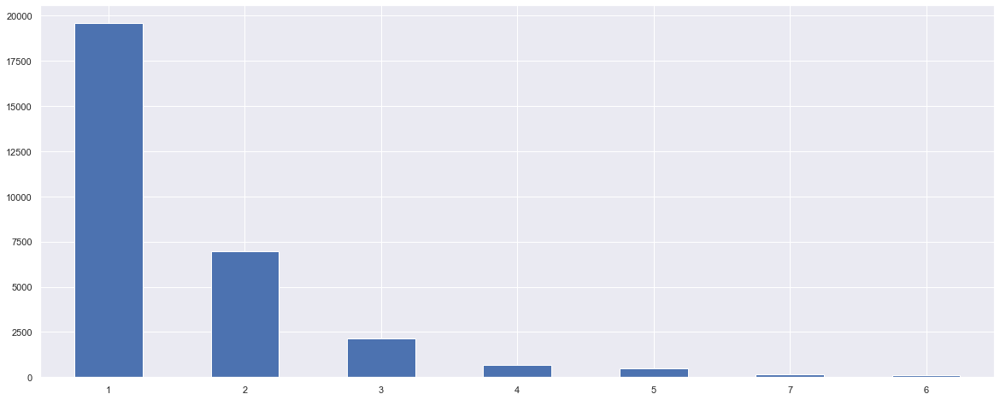

In [548]:
non_zero_edges.options.value_counts().plot(kind="bar", rot=0, figsize=(20,8));

In [550]:
non_zero_edges.query("options==2")

,source,target,title_topic,topic_title,weight,same_level,importance,topic_section,similarity,section_title,title_section,section_topic,options
13,геометрия моделей биотканей,воздействие лазерного излучения,0,1,2,0,0.770,1,0.385,0,0,0,2
14,геометрия моделей биотканей,лазерное излучение,0,1,2,0,0.674,1,0.337,0,0,0,2
27,моделирование,инструментальное средство unimod,0,0,14,13,5.082,3,0.363,0,0,0,2
43,моделирование,проектирование систем,0,0,1,2,0.449,0,0.449,0,0,1,2
45,моделирование,этапы проектирования по,0,0,1,2,0.432,0,0.432,0,0,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
264328,supramolecular chemistry,molecular switches,0,1,2,0,1.738,0,0.869,1,0,0,2
264350,colorimetry,color systems,2,0,3,0,2.016,0,0.672,0,2,0,2
264447,biological metabolites,macromolecules,0,0,3,8,2.715,0,0.905,0,0,4,2
264527,задачи дифракции,дифракция на полуплоскости,0,0,2,2,1.202,2,0.601,0,0,0,2


Нужна такая функция:
1. Найти максимально частое направление (parent-child или child-parent)
2. Если среди связей есть и иерархия, и один уровень, то один уровень игнорируем

In [488]:
non_zero_edges.columns[2:]

Index(['source', 'target', 'title_topic', 'topic_title', 'weight',
       'same_level', 'importance', 'topic_section', 'similarity',
       'section_title', 'title_section', 'section_topic'],
      dtype='object')

In [490]:
Q = nx.from_pandas_edgelist(non_zero_edges, "source", "target", list(non_zero_edges.columns[2:]))

In [491]:
len(G.nodes), len(Q.nodes)

(16287, 6839)

Кластеризуем размеченный граф

In [517]:
communities = community_louvain.best_partition(Q, weight="weight", random_state=42, resolution=0.15)
print("Modularity:", community_louvain.modularity(communities, Q))

nx.set_node_attributes(Q, communities, 'modularity')

partition = {}
for k, v in communities.items():
    if v not in partition:
        partition[v] = {k}
    else:
        partition[v].add(k)

partition = list(partition.values())

nx.algorithms.community.partition_quality(Q, partition)  # coverage and performance

Modularity: 0.5856522615003215


(0.506469746864917, 0.9877845183720623)

In [518]:
modularity = {}
for k, v in communities.items():
    if v not in modularity:
        modularity[v] = [k]
    else:
        modularity[v].append(k)

clusters = {}
cluster_entities = []
extra_entities = []
for k, v in modularity.items():
    if len(v) > 10:
        clusters[k] = v
        cluster_entities.extend(v)
        print(str(k), len(v), v[:10])
    else:
        extra_entities.extend(v)

0 124 ['геометрия моделей биотканей', 'воздействие лазерного излучения', 'лазерное излучение', 'лазерная физика', 'технологические комплексы', 'лазерная обработка материалов', 'применение лазерных технологий', 'новые материалы', 'лазерная обработка', '\ufeffоптика плазмы']
120 77 ['компьютерное моделирование', 'классификация радиотехнических систем', 'электротехнические устройства', 'моделирование электротехнических устройств', 'электрические машины', 'электромеханический преобразователь', 'проектирование электромеханических преобразователей', 'исполнительные устройства', 'двигатели постоянного тока', 'двигатели переменного тока']
2 58 ['моделирование', 'инструментальное средство unimod', 'функциональное моделирование', 'моделирование бизнес-процессов', 'средства моделирования в сапр', 'case-средства моделирования', 'нотация bpmn', 'язык моделирования uml', 'методология dfd', 'оптимизация бизнес-процессов']
3 43 ['проектирование информационных систем', 'проектирование систем', 'этапы п

In [519]:
print(len(modularity), len(clusters))

174 98


In [520]:
for k, v in clusters.items():
    clusters[k] = [v]

clusters_Q = pd.DataFrame.from_dict(clusters).T.reset_index(drop=True)
clusters_Q.columns = ["nodes"]

clusters_Q["text"] = clusters_Q.nodes.str.join(" ")
clusters_Q["lemmas"] = clusters_Q.text.apply(input_preprocessing)
clusters_Q["embedding"] = clusters_Q.lemmas.apply(lambda row: embed(row, model))
clusters_Q

,nodes,text,lemmas,embedding
0,"[геометрия моделей биотканей, воздействие лазе...",геометрия моделей биотканей воздействие лазерн...,"[геометрия, модель, биоткань, воздействие, лаз...","[-0.7940184, -0.6731065, -0.21455646, -0.19901..."
1,"[компьютерное моделирование, классификация рад...",компьютерное моделирование классификация радио...,"[компьютерный, моделирование, классификация, р...","[-0.9050358, -0.16979972, -0.41969776, 0.11465..."
2,"[моделирование, инструментальное средство unim...",моделирование инструментальное средство unimod...,"[моделирование, инструментальный, средство, un...","[0.018613834, 0.21957073, -0.5093409, -0.33703..."
3,"[проектирование информационных систем, проекти...",проектирование информационных систем проектиро...,"[проектирование, информационный, система, прое...","[-0.47586375, 0.0047338177, -0.45052096, -0.20..."
4,"[проектирование программного обеспечения, прог...",проектирование программного обеспечения програ...,"[проектирование, программный, обеспечение, про...","[-0.3141956, 0.26147538, -0.85979235, -0.24577..."
...,...,...,...,...
93,"[разработка дизайна сайта, визуальные образы, ...",разработка дизайна сайта визуальные образы юза...,"[разработка, дизайн, сайт, визуальный, образ, ...","[-0.47160652, 0.26261252, -1.0683585, 0.054441..."
94,"[операционная система unix, управление доступо...",операционная система unix управление доступом ...,"[операционный, система, unix, управление, дост...","[-0.040966097, 0.15893596, -0.43380713, -0.175..."
95,"[chemistry, quantum mechanics, open quantum sy...",chemistry quantum mechanics open quantum syste...,"[chemistri, quantum, mechan, open, quantum, sy...","[0.16747577, 0.40422773, 0.52035445, 0.1214679..."
96,"[dna sequencing, rna sequencing, evolutionary ...",dna sequencing rna sequencing evolutionary gen...,"[dna, sequenc, rna, sequenc, evolutionari, gen...","[0.29691476, 0.52425456, -0.020530175, 0.07806..."


In [17]:
def cosine_within_cluster(list_of_nodes, w2v):
    lemmas = [input_preprocessing(node) for node in list_of_nodes]
    embeds = [embed(lemma, w2v) for lemma in lemmas]
    distances = []
    for vec1 in embeds:
        for vec2 in embeds:
            distances.append(get_similarity(vec1, vec2))
    return np.mean(distances)

In [525]:
clusters_Q["dist"] = clusters_Q.nodes.apply(cosine_within_cluster, w2v=model)

In [526]:
clusters_Q

,nodes,text,lemmas,embedding,dist
0,"[геометрия моделей биотканей, воздействие лазе...",геометрия моделей биотканей воздействие лазерн...,"[геометрия, модель, биоткань, воздействие, лаз...","[-0.7940184, -0.6731065, -0.21455646, -0.19901...",0.406021
1,"[компьютерное моделирование, классификация рад...",компьютерное моделирование классификация радио...,"[компьютерный, моделирование, классификация, р...","[-0.9050358, -0.16979972, -0.41969776, 0.11465...",0.364280
2,"[моделирование, инструментальное средство unim...",моделирование инструментальное средство unimod...,"[моделирование, инструментальный, средство, un...","[0.018613834, 0.21957073, -0.5093409, -0.33703...",0.409347
3,"[проектирование информационных систем, проекти...",проектирование информационных систем проектиро...,"[проектирование, информационный, система, прое...","[-0.47586375, 0.0047338177, -0.45052096, -0.20...",0.474297
4,"[проектирование программного обеспечения, прог...",проектирование программного обеспечения програ...,"[проектирование, программный, обеспечение, про...","[-0.3141956, 0.26147538, -0.85979235, -0.24577...",0.402829
...,...,...,...,...,...
93,"[разработка дизайна сайта, визуальные образы, ...",разработка дизайна сайта визуальные образы юза...,"[разработка, дизайн, сайт, визуальный, образ, ...","[-0.47160652, 0.26261252, -1.0683585, 0.054441...",0.317587
94,"[операционная система unix, управление доступо...",операционная система unix управление доступом ...,"[операционный, система, unix, управление, дост...","[-0.040966097, 0.15893596, -0.43380713, -0.175...",0.529981
95,"[chemistry, quantum mechanics, open quantum sy...",chemistry quantum mechanics open quantum syste...,"[chemistri, quantum, mechan, open, quantum, sy...","[0.16747577, 0.40422773, 0.52035445, 0.1214679...",0.734667
96,"[dna sequencing, rna sequencing, evolutionary ...",dna sequencing rna sequencing evolutionary gen...,"[dna, sequenc, rna, sequenc, evolutionari, gen...","[0.29691476, 0.52425456, -0.020530175, 0.07806...",0.851745


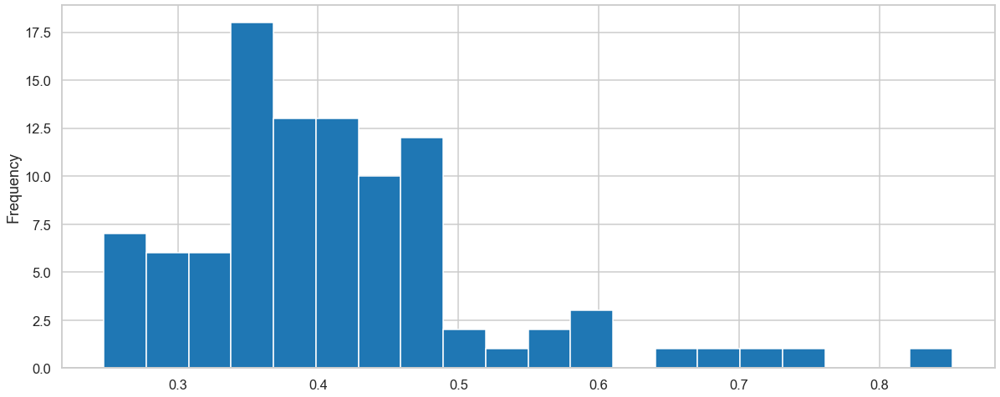

In [531]:
clusters_Q.dist.plot(kind="hist", figsize=(20, 8), bins=20);

In [18]:
from sklearn.metrics.pairwise import cosine_similarity

def calculate_cosine_similarity(vectors):
    num_vectors = len(vectors)
    similarity_matrix = np.zeros((num_vectors, num_vectors))

    for i in range(num_vectors):
        for j in range(num_vectors):
            similarity_matrix[i, j] = cosine_similarity([vectors[i]], [vectors[j]])[0, 0]

    return similarity_matrix

# cosine_similarity_matrix = calculate_cosine_similarity(clusters_Q.embedding)



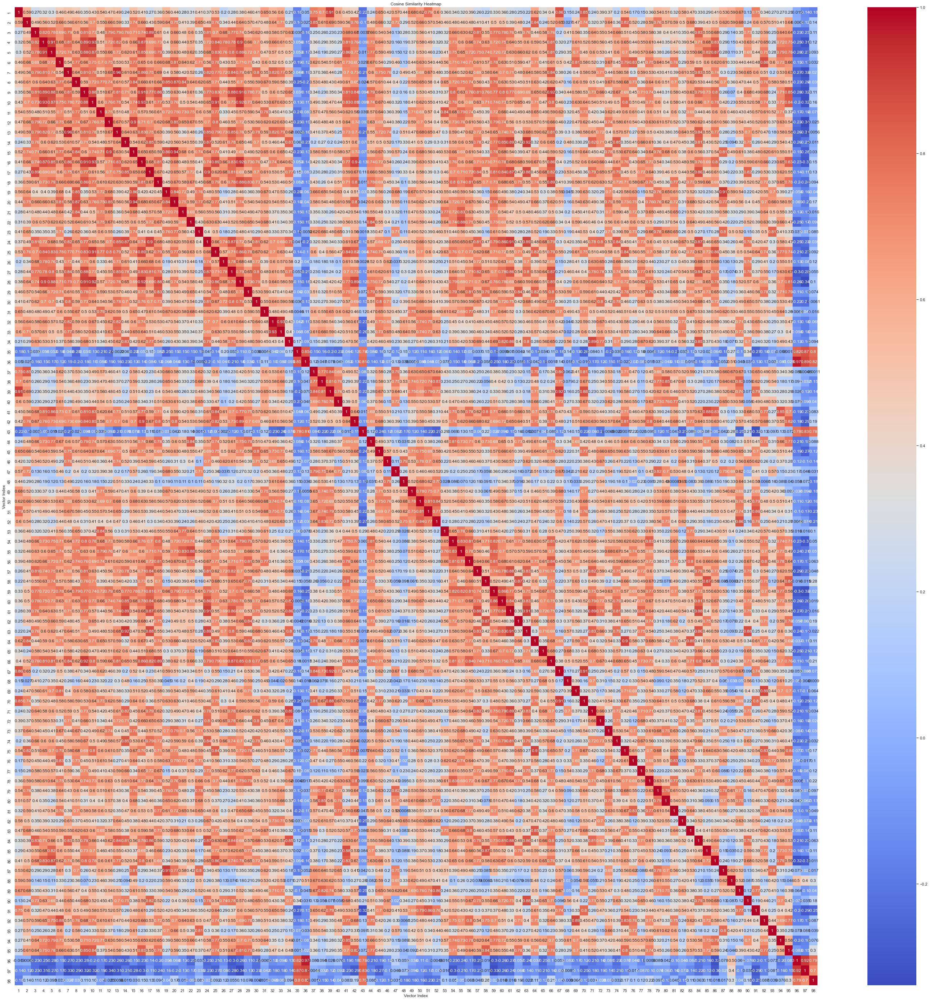

In [534]:
sns.set()
plt.figure(figsize=(50, 50))
sns.heatmap(cosine_similarity_matrix, annot=True, cmap='coolwarm', xticklabels=range(1, 99), yticklabels=range(1, 99))
plt.title('Cosine Similarity Heatmap')
plt.xlabel('Vector Index')
plt.ylabel('Vector Index')
plt.show()

## Разметка связей для частей иерархии, где сущности не извлекаются

In [551]:
df_entities

,Unnamed: 0,course_id,course_title,description,section,topic,qualification,unit_id,up_id,up_title,start_year,module_name,title_entities,section_entities,topic_entities
0,0,2811,Архитектура информационных систем,Целью освоения дисциплины «Архитектура информа...,Функциональная и информационная архитектуры,"Понятия ИС, КИС, АСУ, АСУП. ИС как инструмент ...",bachelor,14.0,6905,Программирование и интернет-технологии,2018,"Специализация ""Информационные системы и технол...",[архитектура информационных систем],[информационная архитектура],[инструменты автоматизации управления]
6,4511129,2821,Архитектура корпоративных информационных систем,Целью освоения дисциплины является усвоение т...,Функциональная и информационная архитектуры,"Понятия ИС, КИС, АСУ, АСУП. ИС как инструмент ...",bachelor,14.0,6905,Программирование и интернет-технологии,2018,"Специализация ""Корпоративные информационные си...","[корпоративные информационные системы, информа...",[информационная архитектура],[инструменты автоматизации управления]
10,4583576,17723,Архитектура и проектирование ИС,Целью освоения дисциплины «Архитектура информа...,Функциональная и информационная архитектуры,"Понятия ИС, КИС, АСУ, АСУП. ИС как инструмент ...",master,51.0,7178,Математическое и компьютерное моделирование,2022,Интеллектуальные информационные системы,[проектирование систем],[информационная архитектура],[инструменты автоматизации управления]
12,5395810,5041,Технологии интеллектуальных вычислений,Целью освоения дисциплины «Технологии интеллек...,Функциональная и информационная архитектуры,"Понятия ИС, КИС, АСУ, АСУП. ИС как инструмент ...",master,2.0,7102,Цифровые системы управления,2020,"Специализация ""Моделирование и структурный ана...",[],[информационная архитектура],[инструменты автоматизации управления]
14,54,2811,Архитектура информационных систем,Целью освоения дисциплины «Архитектура информа...,Функциональная и информационная архитектуры,Различные методики управления организацией,bachelor,14.0,6905,Программирование и интернет-технологии,2018,"Специализация ""Информационные системы и технол...",[архитектура информационных систем],[информационная архитектура],"[управление организацией, методики управления ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1039704,7395819,23819,Алгоритмы интерпретируемого ИИ,Данный курс будет фокусироваться на проблемати...,Теоретические основы интерпретируемости,Понятие интерпретируемости. Типы интерпретируе...,master,49.0,7177,Глубокое обучение и генеративный искусственный...,2022,Фронтирные технологии ИИ,[],[],[]
1039705,7395821,23819,Алгоритмы интерпретируемого ИИ,Данный курс будет фокусироваться на проблемати...,Теоретические основы интерпретируемости,Интерпретируемость в процессе построения модели.,master,49.0,7177,Глубокое обучение и генеративный искусственный...,2022,Фронтирные технологии ИИ,[],[],[процесс старения]
1039706,7395823,23819,Алгоритмы интерпретируемого ИИ,Данный курс будет фокусироваться на проблемати...,Теоретические основы интерпретируемости,Типы объяснимости.,master,49.0,7177,Глубокое обучение и генеративный искусственный...,2022,Фронтирные технологии ИИ,[],[],[]
1039707,7395825,23819,Алгоритмы интерпретируемого ИИ,Данный курс будет фокусироваться на проблемати...,Теоретические основы интерпретируемости,Прозрачность как интерпретируемость.,master,49.0,7177,Глубокое обучение и генеративный искусственный...,2022,Фронтирные технологии ИИ,[],[],[]


In [569]:
data_2 = pd.read_csv("disc_contents20230506_4.csv")
data_2

,Unnamed: 0,id,discipline_code,title,qualification,description,work_status,section_topic,raw_text,author_entities,author_entities_n,extracted_entities,extracted_entities_n,combines_res,combined_res,res_n,comb_res,comb_res_n
0,0,2626,6183,Философия,bachelor,Курс «Философия» даёт целостное представление ...,w,Мышление и предметный мир. Мышление природы: о...,Философия. Курс «Философия» даёт целостное пре...,"['Ценности современного гуманизма', 'Системное...",11,"['Критическое мышление', 'Трансгуманизм', 'Про...",6.0,"['Ценности современного гуманизма', 'Системное...","['Ценности современного гуманизма', 'Системное...",10,"['Ценности современного гуманизма', 'Системное...",11
1,1,2627,10070,Введение в цифровую культуру и программирование,bachelor,"Курс ""Введение в цифровую культуру и программи...",w,Базовые инструменты разработки. Инструментарий...,Введение в цифровую культуру и программировани...,"['Цифровое образование', 'Цифровая этика', 'Те...",7,"['Управление ИТ разработкой', 'Цифровая культу...",7.0,"['Цифровое образование', 'Цифровая этика', 'Те...","['Цифровое образование', 'Цифровая этика', 'Те...",10,"['Цифровое образование', 'Цифровая этика', 'Те...",14
2,2,2628,9334,Проектирование баз данных,bachelor,Дисциплина направлена на формирование понимани...,w,Введение. Основы баз данных. Первое знакомство...,Проектирование баз данных. Дисциплина направле...,"['Язык структурированных запросов (SQL)', 'Хра...",8,"['Проектирование баз данных', 'Базы данных', '...",7.0,"['Язык структурированных запросов (SQL)', 'Хра...","['Язык структурированных запросов (SQL)', 'Хра...",10,"['Язык структурированных запросов (SQL)', 'Хра...",14
3,3,2631,6458,Современные вопросы информатики,bachelor,Дисциплина направлена на формирование системат...,w,БЧХ/РС коды. БЧХ/РС коды. Коды с малой плотнос...,Современные вопросы информатики. Дисциплина на...,"['Теория информации', 'Сверточные коды', 'Лине...",7,"['БЧХ/РС коды', 'Линейные коды', 'Сверточные к...",6.0,"['Теория информации', 'Сверточные коды', 'Лине...","['Теория информации', 'Сверточные коды', 'Лине...",10,"['Теория информации', 'Сверточные коды', 'Лине...",10
4,4,2635,13873,Иностранный язык,bachelor,Целью освоения дисциплины является достижение ...,w,Иностранный язык для академических целей. Откр...,Иностранный язык. Целью освоения дисциплины яв...,['Типология языков'],1,"['Иностранный язык', 'Письменная деловая комму...",4.0,"['Типология языков', 'Письменная деловая комму...","['Типология языков', 'Письменная деловая комму...",5,"['Типология языков', 'Письменная деловая комму...",5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8360,8360,24992,32911,Математическая статистика,bachelor,В курсе рассматриваются статистические методы ...,w,Введение в математическую статистику. Выборка ...,Математическая статистика. В курсе рассматрива...,"['Точечные методы оценивания', 'Проверка стати...",4,"['Проверка статистических гипотез', 'Линейные ...",10.0,"['Точечные методы оценивания', 'Проверка стати...","['Точечные методы оценивания', 'Проверка стати...",10,"['Точечные методы оценивания', 'Проверка стати...",13
8361,8361,25077,33097,Теория вероятностей (базовый уровень),bachelor,В курсе рассматриваются фундаментальные поняти...,w,Введение в теорию вероятностей. Условная вероя...,Теория вероятностей (базовый уровень). В курсе...,"['Центральная предельная теорема', 'Функция ра...",16,"['Случайная величина', 'Теория вероятности', '...",10.0,"['Случайная величина', 'Теория вероятности', '...","['Случайная величина', 'Теория вероятности', '...",10,"['Центральная предельная теорема', 'Функция ра...",16
8362,8362,25079,33109,Алгоритмы и структуры данных,bachelor,"Дисциплина ""Алгоритмы и структуры данных"" пред...",w,Алгоритмы для работы с графами. Введение. Элем...,"Алгоритмы и структуры данных. Дисциплина ""Алго...","['Элементарные структуры данных', 'Хэш-таблицы...",14,"['Элементарные структуры данных', 'Поиск подст...",7.0,"['Элементарные структуры данных', 'Хэш-таблицы...",

In [570]:
len(set(df_entities.course_id.unique()).intersection(data_2.id.unique()))

5085

In [571]:
data_2["author_entities"] = data_2.author_entities.apply(literal_eval)
data_2["comb_res"] = data_2.comb_res.apply(literal_eval)
data_2["valid_res"] = (data_2.author_entities+data_2.comb_res).apply(set)
data_2

,Unnamed: 0,id,discipline_code,title,qualification,description,work_status,section_topic,raw_text,author_entities,author_entities_n,extracted_entities,extracted_entities_n,combines_res,combined_res,res_n,comb_res,comb_res_n,valid_res
0,0,2626,6183,Философия,bachelor,Курс «Философия» даёт целостное представление ...,w,Мышление и предметный мир. Мышление природы: о...,Философия. Курс «Философия» даёт целостное пре...,"[Ценности современного гуманизма, Системное мы...",11,"['Критическое мышление', 'Трансгуманизм', 'Про...",6.0,"['Ценности современного гуманизма', 'Системное...","['Ценности современного гуманизма', 'Системное...",10,"[Ценности современного гуманизма, Системное мы...",11,"{Креативное мышление, Концепции субъекта и объ..."
1,1,2627,10070,Введение в цифровую культуру и программирование,bachelor,"Курс ""Введение в цифровую культуру и программи...",w,Базовые инструменты разработки. Инструментарий...,Введение в цифровую культуру и программировани...,"[Цифровое образование, Цифровая этика, Техноло...",7,"['Управление ИТ разработкой', 'Цифровая культу...",7.0,"['Цифровое образование', 'Цифровая этика', 'Те...","['Цифровое образование', 'Цифровая этика', 'Те...",10,"[Цифровое образование, Цифровая этика, Техноло...",14,"{Цифровое образование, Процесс разработки ПО, ..."
2,2,2628,9334,Проектирование баз данных,bachelor,Дисциплина направлена на формирование понимани...,w,Введение. Основы баз данных. Первое знакомство...,Проектирование баз данных. Дисциплина направле...,"[Язык структурированных запросов (SQL), Хранен...",8,"['Проектирование баз данных', 'Базы данных', '...",7.0,"['Язык структурированных запросов (SQL)', 'Хра...","['Язык структурированных запросов (SQL)', 'Хра...",10,"[Язык структурированных запросов (SQL), Хранен...",14,"{Реляционная модель данных (РМД), Системы упра..."
3,3,2631,6458,Современные вопросы информатики,bachelor,Дисциплина направлена на формирование системат...,w,БЧХ/РС коды. БЧХ/РС коды. Коды с малой плотнос...,Современные вопросы информатики. Дисциплина на...,"[Теория информации, Сверточные коды, Линейные ...",7,"['БЧХ/РС коды', 'Линейные коды', 'Сверточные к...",6.0,"['Теория информации', 'Сверточные коды', 'Лине...","['Теория информации', 'Сверточные коды', 'Лине...",10,"[Теория информации, Сверточные коды, Линейные ...",10,"{Сверточные коды, Теория информации, Коды с ма..."
4,4,2635,13873,Иностранный язык,bachelor,Целью освоения дисциплины является достижение ...,w,Иностранный язык для академических целей. Откр...,Иностранный язык. Целью освоения дисциплины яв...,[Типология языков],1,"['Иностранный язык', 'Письменная деловая комму...",4.0,"['Типология языков', 'Письменная деловая комму...","['Типология языков', 'Письменная деловая комму...",5,"[Типология языков, Письменная деловая коммуник...",5,"{Типология языков, Творческий процесс, Письмен..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8360,8360,24992,32911,Математическая статистика,bachelor,В курсе рассматриваются статистические методы ...,w,Введение в математическую статистику. Выборка ...,Математическая статистика. В курсе рассматрива...,"[Точечные методы оценивания, Проверка статисти...",4,"['Проверка статистических гипотез', 'Линейные ...",10.0,"['Точечные методы оценивания', 'Проверка стати...","['Точечные методы оценивания', 'Проверка стати...",10,"[Точечные методы оценивания, Проверка статисти...",13,"{Статистические методы, Проверка статистически..."
8361,8361,25077,33097,Теория вероятностей (базовый уровень),bachelor,В курсе рассматриваются фундаментальные поняти...,w,Введение в теорию вероятностей. Условная вероя...,Теория вероятностей (базовый уровень). В курсе...,"[Центральная предельная теорема, Функция распр...",16,"['Случайная величина', 'Теория вероятности', '...",10.0,"['Случайная величина', 'Теория вероятности', '...","['Случайная величина', 'Теория вероятности', '...",10,"[Центральная предельная теорема, Функция распр...",16,"{Медиана, Формула полной вероятности, Дискретн..."
8362,8

In [572]:
data_2["valid_res_n"] = data_2.valid_res.apply(len)
data_2

,Unnamed: 0,id,discipline_code,title,qualification,description,work_status,section_topic,raw_text,author_entities,author_entities_n,extracted_entities,extracted_entities_n,combines_res,combined_res,res_n,comb_res,comb_res_n,valid_res,valid_res_n
0,0,2626,6183,Философия,bachelor,Курс «Философия» даёт целостное представление ...,w,Мышление и предметный мир. Мышление природы: о...,Философия. Курс «Философия» даёт целостное пре...,"[Ценности современного гуманизма, Системное мы...",11,"['Критическое мышление', 'Трансгуманизм', 'Про...",6.0,"['Ценности современного гуманизма', 'Системное...","['Ценности современного гуманизма', 'Системное...",10,"[Ценности современного гуманизма, Системное мы...",11,"{Креативное мышление, Концепции субъекта и объ...",11
1,1,2627,10070,Введение в цифровую культуру и программирование,bachelor,"Курс ""Введение в цифровую культуру и программи...",w,Базовые инструменты разработки. Инструментарий...,Введение в цифровую культуру и программировани...,"[Цифровое образование, Цифровая этика, Техноло...",7,"['Управление ИТ разработкой', 'Цифровая культу...",7.0,"['Цифровое образование', 'Цифровая этика', 'Те...","['Цифровое образование', 'Цифровая этика', 'Те...",10,"[Цифровое образование, Цифровая этика, Техноло...",14,"{Цифровое образование, Процесс разработки ПО, ...",14
2,2,2628,9334,Проектирование баз данных,bachelor,Дисциплина направлена на формирование понимани...,w,Введение. Основы баз данных. Первое знакомство...,Проектирование баз данных. Дисциплина направле...,"[Язык структурированных запросов (SQL), Хранен...",8,"['Проектирование баз данных', 'Базы данных', '...",7.0,"['Язык структурированных запросов (SQL)', 'Хра...","['Язык структурированных запросов (SQL)', 'Хра...",10,"[Язык структурированных запросов (SQL), Хранен...",14,"{Реляционная модель данных (РМД), Системы упра...",14
3,3,2631,6458,Современные вопросы информатики,bachelor,Дисциплина направлена на формирование системат...,w,БЧХ/РС коды. БЧХ/РС коды. Коды с малой плотнос...,Современные вопросы информатики. Дисциплина на...,"[Теория информации, Сверточные коды, Линейные ...",7,"['БЧХ/РС коды', 'Линейные коды', 'Сверточные к...",6.0,"['Теория информации', 'Сверточные коды', 'Лине...","['Теория информации', 'Сверточные коды', 'Лине...",10,"[Теория информации, Сверточные коды, Линейные ...",10,"{Сверточные коды, Теория информации, Коды с ма...",10
4,4,2635,13873,Иностранный язык,bachelor,Целью освоения дисциплины является достижение ...,w,Иностранный язык для академических целей. Откр...,Иностранный язык. Целью освоения дисциплины яв...,[Типология языков],1,"['Иностранный язык', 'Письменная деловая комму...",4.0,"['Типология языков', 'Письменная деловая комму...","['Типология языков', 'Письменная деловая комму...",5,"[Типология языков, Письменная деловая коммуник...",5,"{Типология языков, Творческий процесс, Письмен...",5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8360,8360,24992,32911,Математическая статистика,bachelor,В курсе рассматриваются статистические методы ...,w,Введение в математическую статистику. Выборка ...,Математическая статистика. В курсе рассматрива...,"[Точечные методы оценивания, Проверка статисти...",4,"['Проверка статистических гипотез', 'Линейные ...",10.0,"['Точечные методы оценивания', 'Проверка стати...","['Точечные методы оценивания', 'Проверка стати...",10,"[Точечные методы оценивания, Проверка статисти...",13,"{Статистические методы, Проверка статистически...",13
8361,8361,25077,33097,Теория вероятностей (базовый уровень),bachelor,В курсе рассматриваются фундаментальные поняти...,w,Введение в теорию вероятностей. Условная вероя...,Теория вероятностей (базовый уровень). В курсе...,"[Центральная предельная теорема, Функция распр...",16,"['Случайная величина', 'Теория вероятности', '...",10.0,"['Случайная величина', 'Теория вероятности', '...","['Случайная величина', 'Теория вероятности', '...",10,"[Центральная предельная теорема, Функция распр...",16,"{Медиана, Формула полной

In [573]:
val_results = data_2[["id", "valid_res"]]
val_results

,id,valid_res
0,2626,"{Креативное мышление, Концепции субъекта и объ..."
1,2627,"{Цифровое образование, Процесс разработки ПО, ..."
2,2628,"{Реляционная модель данных (РМД), Системы упра..."
3,2631,"{Сверточные коды, Теория информации, Коды с ма..."
4,2635,"{Типология языков, Творческий процесс, Письмен..."
...,...,...
8360,24992,"{Статистические методы, Проверка статистически..."
8361,25077,"{Медиана, Формула полной вероятности, Дискретн..."
8362,25079,"{Алгоритм топологической сортировки, Поиск под..."
8363,25081,"{Термоэлектрические охладители, Классификация ..."


#### Апдейт сущностей из названий дисциплин

In [575]:
val_titles = data_2[["title", "valid_res"]]
val_titles

,title,valid_res
0,Философия,"{Креативное мышление, Концепции субъекта и объ..."
1,Введение в цифровую культуру и программирование,"{Цифровое образование, Процесс разработки ПО, ..."
2,Проектирование баз данных,"{Реляционная модель данных (РМД), Системы упра..."
3,Современные вопросы информатики,"{Сверточные коды, Теория информации, Коды с ма..."
4,Иностранный язык,"{Типология языков, Творческий процесс, Письмен..."
...,...,...
8360,Математическая статистика,"{Статистические методы, Проверка статистически..."
8361,Теория вероятностей (базовый уровень),"{Медиана, Формула полной вероятности, Дискретн..."
8362,Алгоритмы и структуры данных,"{Алгоритм топологической сортировки, Поиск под..."
8363,Системы охлаждения и термостатирования,"{Термоэлектрические охладители, Классификация ..."


In [574]:
df_entities = pd.merge(df_entities, val_results, left_on="course_id", right_on="id")
df_entities

,Unnamed: 0,course_id,course_title,description,section,topic,qualification,unit_id,up_id,up_title,start_year,module_name,title_entities,section_entities,topic_entities,id,valid_res
0,0,2811,Архитектура информационных систем,Целью освоения дисциплины «Архитектура информа...,Функциональная и информационная архитектуры,"Понятия ИС, КИС, АСУ, АСУП. ИС как инструмент ...",bachelor,14.0,6905,Программирование и интернет-технологии,2018,"Специализация ""Информационные системы и технол...",[архитектура информационных систем],[информационная архитектура],[инструменты автоматизации управления],2811,"{Инструменты автоматизации управления, Типы да..."
1,54,2811,Архитектура информационных систем,Целью освоения дисциплины «Архитектура информа...,Функциональная и информационная архитектуры,Различные методики управления организацией,bachelor,14.0,6905,Программирование и интернет-технологии,2018,"Специализация ""Информационные системы и технол...",[архитектура информационных систем],[информационная архитектура],"[управление организацией, методики управления ...",2811,"{Инструменты автоматизации управления, Типы да..."
2,108,2811,Архитектура информационных систем,Целью освоения дисциплины «Архитектура информа...,Функциональная и информационная архитектуры,"Связь методик управления и классов ИС, которые...",bachelor,14.0,6905,Программирование и интернет-технологии,2018,"Специализация ""Информационные системы и технол...",[архитектура информационных систем],[информационная архитектура],[],2811,"{Инструменты автоматизации управления, Типы да..."
3,162,2811,Архитектура информационных систем,Целью освоения дисциплины «Архитектура информа...,Функциональная и информационная архитектуры,"Понятие функции ИС, связь функций ИС и автомат...",bachelor,14.0,6905,Программирование и интернет-технологии,2018,"Специализация ""Информационные системы и технол...",[архитектура информационных систем],[информационная архитектура],[],2811,"{Инструменты автоматизации управления, Типы да..."
4,216,2811,Архитектура информационных систем,Целью освоения дисциплины «Архитектура информа...,Функциональная и информационная архитектуры,Функциональный модуль (подсистема) ИС,bachelor,14.0,6905,Программирование и интернет-технологии,2018,"Специализация ""Информационные системы и технол...",[архитектура информационных систем],[информационная архитектура],[],2811,"{Инструменты автоматизации управления, Типы да..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68970,7072906,23160,Перевод в сфере профессиональной коммуникации,"Факультатив предназначен для тех, кто хочет на...",Особенности перевода с английского языка на ру...,Типичные ошибки буквального перевода. Эквивале...,All_levels,9.0,6943,Программирование в инфокоммуникационных системах,2021,Общеуниверситетские факультативы,[профессиональная коммуникация],[английский язык],[],23160,"{практическая работа, коммуникативные задачи п..."
68971,7073610,23160,Перевод в сфере профессиональной коммуникации,"Факультатив предназначен для тех, кто хочет на...",Особенности перевода с русского языка на англи...,Особенности передачи содержания текста на инос...,All_levels,9.0,6943,Программирование в инфокоммуникационных системах,2021,Общеуниверситетские факультативы,[профессиональная коммуникация],[русский язык],[иностранный язык],23160,"{практическая работа, коммуникативные задачи п..."
68972,7074314,23160,Перевод в сфере профессиональной коммуникации,"Факультатив предназначен для тех, кто хочет на...",Особенности перевода с русского языка на англи...,Границы возможностей перевода с русского языка...,All_levels,9.0,6943,Программирование в инфокоммуникационных системах,2021,Общеуниверситетские факультативы,[профессиональная коммуникация],[русский язык],[русский язык],23160,"{практическая работа, коммуникативные задачи п..."
68973,7075018,23160,Перевод в сфере профессиональной коммуникации,"Факультатив предназначен для тех, кто хочет на...","Навыки перевода (правильность, точность, скоро...",Точность и эквивалентность п

In [577]:
df_titles

,course_title,title_entities
0,Архитектура информационных систем,[архитектура информационных систем]
1,Основы академической коммуникации,[]
2,Иностранный язык в профессиональной деятельности,"[иностранный язык, профессиональная деятельнос..."
3,Основы естественнонаучных процессов,[]
4,Надежность технических систем,[расчет надежности технических систем]
...,...,...
4065,Вычислительная оптика,[вычислительная оптика]
4066,Алгоритмы и большие данные в химии и материало...,"[big data, chemistry of materials, nanomateria..."
4067,Теория глубокого обучения,[]
4068,Алгоритмы интерпретируемого ИИ,[]


In [578]:
df_titles = pd.merge(df_titles, val_titles, left_on="course_title", right_on="title")
df_titles

,course_title,title_entities,title,valid_res
0,Архитектура информационных систем,[архитектура информационных систем],Архитектура информационных систем,"{Инструменты автоматизации управления, Типы да..."
1,Архитектура информационных систем,[архитектура информационных систем],Архитектура информационных систем,"{Инструменты автоматизации управления, Типы да..."
2,Архитектура информационных систем,[архитектура информационных систем],Архитектура информационных систем,"{Инструменты автоматизации управления, Типы да..."
3,Архитектура информационных систем,[архитектура информационных систем],Архитектура информационных систем,"{Инструменты автоматизации управления, Типы да..."
4,Основы академической коммуникации,[],Основы академической коммуникации,"{Деловая коммуникация, Языковые принципы, Сост..."
...,...,...,...,...
7904,Дополнительные главы линейной алгебры (продвин...,[линейная алгебра],Дополнительные главы линейной алгебры (продвин...,"{Операции с векторами, Теория операторов, Обра..."
7905,Оптотехнические системы технологических лазеров,"[технологические лазеры, техническая система]",Оптотехнические системы технологических лазеров,"{Гауссовы пучки, Применение лазерных технологи..."
7906,Теория глубокого обучения,[],Теория глубокого обучения,{Глубокое обучение}
7907,Алгоритмы интерпретируемого ИИ,[],Алгоритмы интерпретируемого ИИ,"{Алгоритмы машинного обучения, Процесс старени..."


In [580]:
df_titles.drop_duplicates(subset=["course_title", "title"], inplace=True, ignore_index=True)
df_titles

,course_title,title_entities,title,valid_res
0,Архитектура информационных систем,[архитектура информационных систем],Архитектура информационных систем,"{Инструменты автоматизации управления, Типы да..."
1,Основы академической коммуникации,[],Основы академической коммуникации,"{Деловая коммуникация, Языковые принципы, Сост..."
2,Иностранный язык в профессиональной деятельности,"[иностранный язык, профессиональная деятельнос...",Иностранный язык в профессиональной деятельности,"{Эффективная коммуникация, Представление инфор..."
3,Основы естественнонаучных процессов,[],Основы естественнонаучных процессов,"{Международное сотрудничество, Процессы измере..."
4,Управление рисками,[управление рисками],Управление рисками,"{Системы управления, Концепция приемлемого рис..."
...,...,...,...,...
4016,Дополнительные главы линейной алгебры (продвин...,[линейная алгебра],Дополнительные главы линейной алгебры (продвин...,"{Операции с векторами, Теория операторов, Обра..."
4017,Оптотехнические системы технологических лазеров,"[технологические лазеры, техническая система]",Оптотехнические системы технологических лазеров,"{Гауссовы пучки, Применение лазерных технологи..."
4018,Теория глубокого обучения,[],Теория глубокого обучения,{Глубокое обучение}
4019,Алгоритмы интерпретируемого ИИ,[],Алгоритмы интерпретируемого ИИ,"{Алгоритмы машинного обучения, Процесс старени..."


In [603]:
from operator import itemgetter



In [706]:
node_lens = {node: len(node.split()) for node in node_embedding}
node_df = pd.DataFrame(node_lens, index=range(0, len(node_lens))).T[0].reset_index()
node_df.columns = ["entity", "length"]
node_df

,entity,length
0,геометрия моделей биотканей,3
1,моделирование,1
2,квазиньютоновские методы,2
3,метод градиентного спуска,3
4,аддитивные технологии,2
...,...,...
16282,processing of navigation information,4
16283,коммуникации,1
16284,information and self-organization,3
16285,telescopic systems,2


<Axes: ylabel='length'>

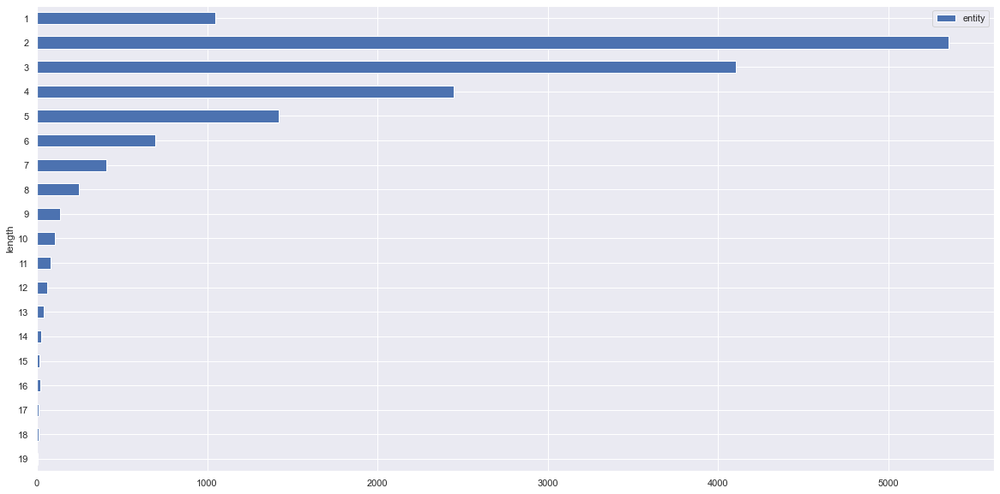

In [725]:
node_df.groupby(["length"]).count().query("length < 20").sort_index(ascending=False).plot(kind="barh", figsize=(20,10))

Будем считать, что с сущностью все ок, если в ней 6 слов или меньше.

In [726]:
node_embedding_short = {node: emb for node, emb in node_embedding.items() if len(node.split()) <= 6}
len(node_embedding_short), len(node_embedding)

(15068, 16287)

In [776]:
def get_most_similar_possible_entitity(ent, embeddings, options, model, max_res=1, lowercase=True):
    vec = embed(input_preprocessing(ent), model)
    
    if not lowercase:
        options_dict = {option: embeddings[option.lower()] for option in options if option.lower() in embeddings}
    else:
        options_dict = {option.lower(): embeddings[option.lower()] for option in options if option.lower() in embeddings}

    for entity, vector in options_dict.items():
        sim = get_similarity(vec, vector) 
        options_dict[entity] = 0 if sim == 1 else sim
    
    closest_entity = max(options_dict.items(), key=itemgetter(1))[0] if options_dict else 0
    
    if max_res != 1 and closest_entity != 0:
        best_sim = options_dict.pop(closest_entity)
        top = sorted(options_dict.items(), key=itemgetter(1), reverse=True)
        top = list(filter(lambda pair: best_sim - pair[1] <= 0.05, top))[:max_res]
        top = list(map(lambda pair: pair[0], top))

        return [closest_entity]+top
    
    return [closest_entity] if closest_entity != 0 else 0

In [617]:
df_titles["n_ents"] = df_titles.title_entities.apply(len)
df_empty_titles = df_titles[df_titles.n_ents == 0]
df_empty_titles

,course_title,title_entities,title,valid_res,n_ents
1,Основы академической коммуникации,[],Основы академической коммуникации,"{Деловая коммуникация, Языковые принципы, Сост...",0
3,Основы естественнонаучных процессов,[],Основы естественнонаучных процессов,"{Международное сотрудничество, Процессы измере...",0
8,Основы оптоинформатики,[],Основы оптоинформатики,"{Информационные технологии, Оптические аналого...",0
9,Численные методы фотоники,[],Численные методы фотоники,{Методы разработки и анализа математических мо...,0
10,Основы электротехники,[],Основы электротехники,"{Электрические цепи постоянного тока, Двухполю...",0
...,...,...,...,...,...
4009,"Производственная, преддипломная / Senior Inter...",[],"Производственная, преддипломная / Senior Inter...",{Research Internship},0
4010,"Производственная, научно-исследовательская / R...",[],"Производственная, научно-исследовательская / R...",{Research Internship},0
4018,Теория глубокого обучения,[],Теория глубокого обучения,{Глубокое обучение},0
4019,Алгоритмы интерпретируемого ИИ,[],Алгоритмы интерпретируемого ИИ,"{Алгоритмы машинного обучения, Процесс старени...",0


In [769]:
df_empty_titles["title_result"] = df_empty_titles.progress_apply(lambda row: get_most_similar_possible_entitity(row["course_title"],
                                                                                 embeddings=node_embedding_short, options=row["valid_res"], 
                                                                                 model=model, max_res=1), axis=1)

  0%|          | 0/1471 [00:00<?, ?it/s]

100%|██████████| 1471/1471 [00:01<00:00, 1132.92it/s]


In [770]:
df_empty_titles[df_empty_titles["title_result"] != 0].shape

(1467, 8)

In [771]:
df_empty_titles.sample(10)

,course_title,title_entities,title,valid_res,n_ents,possible_result,possible_result_2,title_result
2672,Теория вычислительной сложности,[],Теория вычислительной сложности,"{Теория вычислимости, Вероятностные вычисления}",0,теория сложности,Теория вычислимости,[теория вычислимости]
3143,Цифровые миры / Digital Worlds,[],Цифровые миры / Digital Worlds,"{Art history, Digital Project Management, Touc...",0,цифровое искусство,Digital Project Management,[digital project management]
567,Теория коммуникаций,[],Теория коммуникаций,{Методические навыки диагностирования стиля ко...,0,теория медиа,Визуальная коммуникация,[методологические традиции изучения социальной...
3840,Световые приборы и светотехническое проектиров...,[],Световые приборы и светотехническое проектиров...,"{Системы фотореалистичной визуализации, Светот...",0,проектирование оптических приборов,Световые приборы,[световые приборы]
3328,Материалы чистой энергетики,[],Материалы чистой энергетики,"{Нетрадиционные методы производства энергии, Н...",0,переработка полимерных материалов,Новые материалы,[новые материалы]
3860,Цифровые модели,[],Цифровые модели,"{Цифровой двойник промышленного объекта, Техно...",0,цифровая бизнес-модель,Цифровой двойник промышленного объекта,[цифровой двойник промышленного объекта]
1804,Биофизика,[],Биофизика,"{Кинетика биологических процессов, Биофизика м...",0,биофизика мембран,Биофизика мембран,[биофизика мембран]
500,История (Россия в истории современных междунар...,[],История (Россия в истории современных междунар...,{Перспективы современного международного разви...,0,петербург в контексте отечественной истории,Перспективы современного международного развития,[реалии современного международного развития р...
1403,Бек-энд разработка,[],Бек-энд разработка,"{CI/CD, Sequelize ORM, Тестирование ПО, Базы д...",0,разработка кд,Разработка микросервисных приложений,[разработка микросервисных приложений]
869,Интернет-журналистика / Digital Journalism,[],Интернет-журналистика / Digital Journalism,"{Интернет-аудитория, Понимание журналистики, М...",0,интернет журналистика,Интернет журналистика,[интернет журналистика]


#### Апдейт сущностей из разделов

In [773]:
val_sections = df_entities[["section", "valid_res"]]
val_sections

,section,valid_res
0,Функциональная и информационная архитектуры,"{Инструменты автоматизации управления, Типы да..."
1,Функциональная и информационная архитектуры,"{Инструменты автоматизации управления, Типы да..."
2,Функциональная и информационная архитектуры,"{Инструменты автоматизации управления, Типы да..."
3,Функциональная и информационная архитектуры,"{Инструменты автоматизации управления, Типы да..."
4,Функциональная и информационная архитектуры,"{Инструменты автоматизации управления, Типы да..."
...,...,...
68970,Особенности перевода с английского языка на ру...,"{практическая работа, коммуникативные задачи п..."
68971,Особенности перевода с русского языка на англи...,"{практическая работа, коммуникативные задачи п..."
68972,Особенности перевода с русского языка на англи...,"{практическая работа, коммуникативные задачи п..."
68973,"Навыки перевода (правильность, точность, скоро...","{практическая работа, коммуникативные задачи п..."


In [774]:
df_section["n_ents"] = df_section.section_entites.apply(len)
df_empty_section = df_section[df_section.n_ents == 0]
df_empty_section = pd.merge(df_empty_section, val_sections, left_on="section", right_on="section")
df_empty_section.drop_duplicates(subset=["section"], inplace=True, ignore_index=True)
df_empty_section

,section,section_entites,n_ents,valid_res
0,Основы публичной речи,[],0,"{Деловая коммуникация, Языковые принципы, Сост..."
1,История развития наук,[],0,"{Международное сотрудничество, Процессы измере..."
2,Природа и общество,[],0,"{Международное сотрудничество, Процессы измере..."
3,Способы повышения надежности приборов и систем,[],0,"{Теория надежности, Математическая статистика,..."
4,Риск и безопасность. Риск и менеджмент,[],0,"{Охрана окружающей среды, Системный анализ без..."
...,...,...,...,...
7327,Грамматика перевода,[],0,"{практическая работа, коммуникативные задачи п..."
7328,Фоновые знания и перевод,[],0,"{практическая работа, коммуникативные задачи п..."
7329,Технические средства перевода,[],0,"{практическая работа, коммуникативные задачи п..."
7330,"Навыки перевода (правильность, точность, скоро...",[],0,"{практическая работа, коммуникативные задачи п..."


In [777]:
df_empty_section["section_result"] = df_empty_section.progress_apply(lambda row: get_most_similar_possible_entitity(row["section"],
                                                                                 embeddings=node_embedding_short, options=row["valid_res"], 
                                                                                 model=model, max_res=2), axis=1)

100%|██████████| 7332/7332 [00:05<00:00, 1422.54it/s]


In [741]:
df_empty_section[df_empty_section["section_result"] != 0].shape

(7318, 6)

In [778]:
df_empty_section.sample(10)

,section,section_entites,n_ents,valid_res,section_result
6395,"Основные задачи, решаемые методами квантовой х...",[],0,"{Основные методы квантовой химии, Основные тип...",[основные методы квантовой химии]
3787,Макроскопическая электродинамика и метод КРВО,[],0,"{Уравнение Ричмонда метода моментов, Уравнения...",[классификация численных методов электродинами...
2948,Наночастицы и наноматериалы,[],0,"{Формирование наноструктур, ﻿Полимеры, Квантов...",[﻿полимеры]
516,Methods for characterizing the porous structur...,[],0,"{Nanoscale objects, Synchrotron radiation-base...",[features of nanostructured materials characte...
3132,Как мы представляем себе мышление?,[],0,"{Научная деятельность, Научная коммуникация, П...","[критическое мышление, понимание границ научно..."
4113,The homogeneous electron gas in the Hartree-Fo...,[],0,"{Density functional theory, The many-electron ...","[the many-electron atom, second quantization, ..."
795,Синхронные и коллекторные силовые микродвигатели,[],0,"{Постоянные магниты, Машины синхронной связи, ...","[асинхронные силовые микродвигатели, синхронны..."
3325,Общие понятия фитопатологии,[],0,"{Инновационные технологии, Болезни растений, М...",[понятие патологического процесса]
72,Программирование С++ в UnrealEngine 4,[],0,"{Компьютерная графика, Искусственный интеллект...",[язык css]
54,Общие требования к организации питания детей в...,[],0,"{Детское питание, Инновационные технологии, Те...",[детское питание]


#### Апдейт сущностей из тем

In [657]:
val_topics = df_entities[["topic", "valid_res"]]
val_topics.head()

,topic,valid_res
0,"Понятия ИС, КИС, АСУ, АСУП. ИС как инструмент ...","{Инструменты автоматизации управления, Типы да..."
1,Различные методики управления организацией,"{Инструменты автоматизации управления, Типы да..."
2,"Связь методик управления и классов ИС, которые...","{Инструменты автоматизации управления, Типы да..."
3,"Понятие функции ИС, связь функций ИС и автомат...","{Инструменты автоматизации управления, Типы да..."
4,Функциональный модуль (подсистема) ИС,"{Инструменты автоматизации управления, Типы да..."


In [665]:
df_topic["n_ents"] = df_topic.topic_entities.apply(len)
df_empty_topic = df_topic[df_topic.n_ents == 0]
df_empty_topic = pd.merge(df_empty_topic, val_topics, left_on="topic", right_on="topic")
df_empty_topic.drop_duplicates(subset=["topic"], inplace=True, ignore_index=True)
df_empty_topic

,topic,topic_entities,n_ents,valid_res
0,"Связь методик управления и классов ИС, которые...",[],0,"{Инструменты автоматизации управления, Типы да..."
1,"Понятие функции ИС, связь функций ИС и автомат...",[],0,"{Инструменты автоматизации управления, Типы да..."
2,Функциональный модуль (подсистема) ИС,[],0,"{Инструменты автоматизации управления, Типы да..."
3,Понятие информационного объекта,[],0,"{Инструменты автоматизации управления, Типы да..."
4,Самопрезентация,[],0,"{Эффективная коммуникация, Представление инфор..."
...,...,...,...,...
32161,Введение. Понятие архитектуры ПО.,[],0,"{Язык моделирования UML, Основы объектно-ориен..."
32162,Моделирование в архитектуре.,[],0,"{Язык моделирования UML, Основы объектно-ориен..."
32163,Архитектурные стили.,[],0,"{Язык моделирования UML, Основы объектно-ориен..."
32164,Проектирование распределенных приложений.,[],0,"{Язык моделирования UML, Основы объектно-ориен..."


In [779]:
df_empty_topic["topic_result"] = df_empty_topic.progress_apply(lambda row: get_most_similar_possible_entitity(row["topic"],
                                                                                 embeddings=node_embedding_short, options=row["valid_res"], 
                                                                                 model=model, max_res=3), axis=1)


100%|██████████| 32166/32166 [00:29<00:00, 1085.93it/s]


In [746]:
df_empty_topic[df_empty_topic["topic_result"] != 0].shape

(32108, 6)

In [780]:
df_empty_topic.sample(10)

,topic,topic_entities,n_ents,valid_res,possible_result,topic_result
26961,Поведенческая и ценностная сегментация,[],0,"{Прогнозирование, Системы массового обслуживан...","[Дискретно-событийная модель, Модели данных, П...","[дискретно-событийная модель, модели данных, п..."
10724,Управление технологическим проектированием,[],0,"{Модель предметной области, Методология MPR, Д...",[Процесс проектирования],[процесс проектирования]
12070,Проблемы извлечения признаков из аудио данных,[],0,"{Методы и алгоритмы машинного обучения, Алгори...","[Обработка информации, Методы и алгоритмы анал...","[обработка информации, методы и алгоритмы анал..."
19401,Технологии рационального поведения в конфликте,[],0,"{Структура конфликта, Глобальные и региональны...",[Стратегии поведения в конфликте],[стратегии поведения в конфликте]
23247,"Фазы, их цели и вехи",[],0,"{Системное тестирование ПО, Интеграционное тес...","[Жизненный цикл ПО, Анализ рисков разработки ПО]","[жизненный цикл по, анализ рисков разработки по]"
18530,"Понятие определенного интеграла, классы и свой...",[],0,"{Ряд Тейлора, Правила дифференцирования функци...","[Неопределенный и определенный интегралы, Несо...","[неопределенный и определенный интегралы, несо..."
26831,"Нормальная микрофлора человека, ее функции и з...",[],0,"{Питание микроорганизмов, Биотехнология микроо...",[Влияние внешней среды на микроорганизмы],[влияние внешней среды на микроорганизмы]
4835,Назначение модулятора в системе связи.,[],0,"{Теорема Винера-Хинчина, Согласованные фильтры...",[Обобщенная функциональная схема системы связи],[обобщенная функциональная схема системы связи]
10954,Amino acid speed Limiting amino acid,[],0,"{Food Chemistry, Theories and concepts of nutr...",[Theories and concepts of nutrition],[theories and concepts of nutrition]
14220,"Система, модели концептуальные, физические, ма...",[],0,"{Качество систем дискретного управления, Устой...",[Модели дискретных систем],[модели дискретных систем]


Добавим новые сущности в таблицу с извлеченными.

In [754]:
df_entities.columns

Index(['Unnamed: 0', 'course_id', 'course_title', 'description', 'section',
       'topic', 'qualification', 'unit_id', 'up_id', 'up_title', 'start_year',
       'module_name', 'title_entities', 'section_entities', 'topic_entities',
       'id', 'valid_res'],
      dtype='object')

In [781]:
df_res_sections_topics_update = pd.merge(df_res_sections_topics, df_empty_titles[["title", "title_result"]], left_on="course_title", right_on="title", how="left")
df_res_sections_topics_update.shape, df_res_sections_topics.shape

((1039709, 17), (1039709, 15))

In [782]:
df_res_sections_topics_update = pd.merge(df_res_sections_topics_update, df_empty_section[["section", "section_result"]], left_on="section", right_on="section", how="left")
df_res_sections_topics_update.shape

(1039709, 18)

In [783]:
df_res_sections_topics_update = pd.merge(df_res_sections_topics_update, df_empty_topic[["topic", "topic_result"]], left_on="topic", right_on="topic", how="left")
df_res_sections_topics_update.shape

(1039709, 19)

In [784]:
df_res_sections_topics_update = df_res_sections_topics_update.query("title_result != 0 & section_result != 0 & topic_result != 0")
df_res_sections_topics_update["title_result"] = df_res_sections_topics_update["title_result"].fillna("").apply(list)
df_res_sections_topics_update["section_result"] = df_res_sections_topics_update["section_result"].fillna("").apply(list)
df_res_sections_topics_update["topic_result"] = df_res_sections_topics_update["topic_result"].fillna("").apply(list)
df_res_sections_topics_update.shape

(1039405, 19)

In [785]:
df_res_sections_topics_update.sample(10)

,Unnamed: 0,course_id,course_title,description,section,topic,qualification,unit_id,up_id,up_title,start_year,module_name,title_entities,section_entites,topic_entities,title,title_result,section_result,topic_result
983697,6698467,22689,Квантовая кибернетика,Характерным недостатком современного образован...,Процессная логика и принятие решений,Поведение и алгоритмы. Свобода воли. Единица с...,All_levels,58.0,7185,Искусственный интеллект в промышленности,2022,Общеуниверситетские факультативы,[],[принятие решений],[],Квантовая кибернетика,[элементы квантовой теории игр],[],[сложные системы]
490412,2283718,14937,Человек в современной биотехнической системе,В современном мире человек постоянно сталкивае...,Роль человека в биотехнической системе,Человек в роли человек-оператор,bachelor,34.0,6999,"Мультимедиа-технологии, дизайн и юзабилити",2020,Факультативные дисциплины,[техническая система],[техническая система],[],NaN,[],[],[человек-оператор]
410200,6157715,22679,Практики креативности,"Этот курс о том, как по-новому смотреть на при...",Этапы креативного процесса в разных подходах,Этапы креативного процесса. Особенности работы...,bachelor,22.0,7340,Прикладная оптика,2019,Общеуниверситетские факультативы,[],[],[основные этапы креативного процесса],Практики креативности,[креативность],[основные этапы креативного процесса],[]
497804,3764379,14989,Управление карьерой,"Нет ни одного студента на земле, который не за...",Учимся дизайну карьеры,Основы дизайна карьеры,master,22.0,7191,Веб-технологии,2022,Soft Skills,[управление карьерой],[],[],NaN,[],"[жизненные стратегии и цели, модель эффективно...","[модель эффективного дня, жизненные стратегии ..."
817540,7201467,22672,IELTS и основы академического обучения / IELTS...,The IELTS Extended Academic course implies ful...,IELTS Academic Speaking,"Types of tasks in the ""IELTS Speaking"" section...",All_levels,9.0,6974,Информатика и программирование,2020,Общеуниверситетские факультативы,[],[],[],IELTS и основы академического обучения / IELTS...,[иностранный язык в коммуникативно-прагматичес...,[иностранный язык в коммуникативно-прагматичес...,[иностранный язык в коммуникативно-прагматичес...
774423,4457340,19204,Инженерная психология,"Курс ""Инженерная психология"" дает целостное пр...",Проектирование цифровых интерфейсов с учетом о...,Восприятие. Строение человеческого глаза.,bachelor,12.0,7233,Нейротехнологии и программирование,2022,Майнор 2 Пользовательское восприятие программн...,[инженерная психология],[],[],NaN,[],[﻿проектирование пользовательских интерфейсов],[восприятие цвета]
919021,6354499,22690,Актуальные поэтические практики (креативное пи...,Что такое стихотворение? Рифмованные предложен...,Поэтический текст в контексте социокультурного...,Структурные особенности поэтического высказыва...,All_levels,9.0,6945,Цифровое производство,2019,Общеуниверситетские факультативы,[],[],[],Актуальные поэтические практики (креативное пи...,[история европейской литературы],[русский язык],"[критическая аргументация, история европейской..."
524641,4826653,18958,Методология социальных наук,Дисциплина «Методология социальных наук» являе...,Измерение социальных явлений,Типы шкал и правила их построения,master,1.0,7225,"Технонаука, инновации, экономика",2022,Обязательные дисциплины,[],[],[],Методология социальных наук,[инструменты социологического исследования],[социологические исследования],[классификация вин]
497600,5519370,2739,Управление карьерой,"Нет ни одного студента на земле, который не за...",Учимся дизайну карьеры. Career Identity,Основы профессионального успеха и деятельностн...,bachelor,22.0,6940,Интеллектуальные системы в гуманитарной сфере,2019,Элективная дисциплина Soft Skills (выбор 2-х д...,[управление карьерой],[],[],NaN,[],"[смысловая навигация личности, жизненные страт...",[профессиональная навигация]
748557,4225024,17619,Элементы статистики и Введение в МО (инструмен...,The course consists of two parts: 1) The first...,Introduction to Machine Learning (tools),Classification problem

In [787]:
df_res_sections_topics_update["title_entities_full"] = df_res_sections_topics_update["title_entities"]+df_res_sections_topics_update["title_result"]
df_res_sections_topics_update["section_entities_full"] = df_res_sections_topics_update["section_entites"]+df_res_sections_topics_update["section_result"]
df_res_sections_topics_update["topic_entities_full"] = df_res_sections_topics_update["topic_entities"]+df_res_sections_topics_update["topic_result"]
df_res_sections_topics_update.sample(5)

,Unnamed: 0,course_id,course_title,description,section,topic,qualification,unit_id,up_id,up_title,...,title_entities,section_entites,topic_entities,title,title_result,section_result,topic_result,title_entities_full,section_entities_full,topic_entities_full
282870,1069213,3157,Лазерная фотоника,В процессе изучения дисциплины студенты изучаю...,Балансные уравнения,Балансные уравнения. Используемые приближения.,bachelor,50.0,6907,Оптико-электронные информационно-измерительные...,...,[﻿лазерная фотоника],[],[],NaN,[],[энергия световой волны],[энергия световой волны],[﻿лазерная фотоника],[энергия световой волны],[энергия световой волны]
255688,900306,4662,Регуляция эмоционального состояния в профессио...,Данная дисциплина проводится факультативно для...,Негативные психические состояния в профессиона...,Психология стресса. Стадии протекания стресса ...,master,24.0,7223,Корпоративные финансы и венчурные инвестиции /...,...,[профессиональная деятельность эколога],[профессиональная деятельность эколога],"[способы саморегуляции, профессиональная деяте...",NaN,[],[],[],[профессиональная деятельность эколога],[профессиональная деятельность эколога],"[способы саморегуляции, профессиональная деяте..."
777391,4484005,14957,"Математическое моделирование, численные методы...",Моделирование (описание) прикладных задач обра...,Устойчивые численные методы решения прикладных...,"Устранение шумов: фильтры адаптивный Винера, м...",All_levels,12.0,7084,Компьютерные системы и технологии,...,"[численные методы, математическое моделирование]","[численные методы решения оду, численные методы]",[],NaN,[],[],[интерполяция],"[численные методы, математическое моделирование]","[численные методы решения оду, численные методы]",[интерполяция]
626020,7303897,25208,Вокальная и танцевальная импровизация,Основной целью курса является улучшение качест...,Танцевальная импровизация,Импульсы движения,All_levels,40.0,7246,Иностранные языки и информационные технологии ...,...,[],[],[],Вокальная и танцевальная импровизация,[вербальная коммуникация],[вербальная коммуникация],[],[вербальная коммуникация],[вербальная коммуникация],[]
768810,4412989,15273,Радиофотоника,"В рамках дисциплины "" Радиофотоника"" изучаются...",Искажение сигнала в оптоволоконных линиях. Эфф...,Рылеевское рассеяние.,bachelor,33.0,7306,Лазерная фотоника и оптоэлектроника,...,[],[],[],Радиофотоника,[источники шумов в волоконно-оптических линиях...,[искажение сигнала в оптоволоконных линиях],[фотоника миллиметрового диапазона длин волн],[источники шумов в волоконно-оптических линиях...,[искажение сигнала в оптоволоконных линиях],[фотоника миллиметрового диапазона длин волн]


In [788]:
df_entities = df_res_sections_topics_update.copy()
df_entities.rename(columns={"section_entites": "section_entities"}, inplace=True)
df_entities = df_entities.drop_duplicates(subset=["course_title", "section", "topic"])
df_entities.sample(3)

,Unnamed: 0,course_id,course_title,description,section,topic,qualification,unit_id,up_id,up_title,...,title_entities,section_entities,topic_entities,title,title_result,section_result,topic_result,title_entities_full,section_entities_full,topic_entities_full
860966,5493188,13874,Расширенная телесность: программирование осяза...,The course is dedicated to rethinking the conc...,"Theory, methods and approaches to academic res...",Introduction to research theory,master,15.0,7168,Искусство и наука / Art & Science,...,[],[],[],Расширенная телесность: программирование осяза...,[technological art practice],[research],"[technological art practice, research]",[technological art practice],[research],"[technological art practice, research]"
670926,3440561,11700,Прикладная элементалогия,В данном курс систематизированы сведения о хим...,Макроэлементы,Фосфор,master,11.0,7052,Биотехнология продуктов функционального назнач...,...,[],[],[],Прикладная элементалогия,[биология],[физиология питания],[физиология питания],[биология],[физиология питания],[физиология питания]
705480,3598962,3902,Маркетинговый анализ инноваций,"В результате изучения дисциплины ""Маркетинговы...",Методы и модели анализа рынка инноваций,Моделирование возможностей и рисков,bachelor,1.0,6908,Управление технологическими инновациями,...,[],"[анализ рынка, рынок инноваций, анализ рынка и...",[],Маркетинговый анализ инноваций,[маркетинговый анализ инновационных проектов],[],[математическое моделирование],[маркетинговый анализ инновационных проектов],"[анализ рынка, рынок инноваций, анализ рынка и...",[математическое моделирование]


In [789]:
same_level = dict.fromkeys(G.edges, 0)     # 1
title_section = dict.fromkeys(G.edges, 0)  # 2
title_topic = dict.fromkeys(G.edges, 0)    # 3
section_topic = dict.fromkeys(G.edges, 0)  # 4
section_title = dict.fromkeys(G.edges, 0)  # 5
topic_section = dict.fromkeys(G.edges, 0)  # 6
topic_title = dict.fromkeys(G.edges, 0)    # 7

In [790]:
# title_section
title_section = df_entities[["title_entities_full", "section_entities_full"]].explode("title_entities_full").explode("section_entities_full").dropna()
title_section["edge"] = (title_section.title_entities_full+","+title_section.section_entities_full).str.split(",").apply(tuple)
print("title_section: ", title_section.shape)

# title_topic
title_topic = df_entities[["title_entities_full", "topic_entities_full"]].explode("title_entities_full").explode("topic_entities_full").dropna()
title_topic["edge"] = (title_topic.title_entities_full+","+title_topic.topic_entities_full).str.split(",").apply(tuple)
print("title_topic: ", title_topic.shape)

# section_topic
section_topic = df_entities[["section_entities_full", "topic_entities_full"]].explode("section_entities_full").explode("topic_entities_full").dropna()
section_topic["edge"] = (section_topic.section_entities_full+","+section_topic.topic_entities_full).str.split(",").apply(tuple)
print("section_topic: ", section_topic.shape)

# section_title
section_title = df_entities[["section_entities_full", "title_entities_full"]].explode("section_entities_full").explode("title_entities_full").dropna()
section_title["edge"] = (section_title.section_entities_full+","+section_title.title_entities_full).str.split(",").apply(tuple)
print("section_title: ", section_title.shape)

# topic_section
topic_section = df_entities[["topic_entities_full", "section_entities_full"]].explode("topic_entities_full").explode("section_entities_full").dropna()
topic_section["edge"] = (topic_section.topic_entities_full+","+topic_section.section_entities_full).str.split(",").apply(tuple)
print("topic_section: ", topic_section.shape)

# topic_title
topic_title = df_entities[["topic_entities_full", "title_entities_full"]].explode("topic_entities_full").explode("title_entities_full").dropna()
topic_title["edge"] = (topic_title.topic_entities_full+","+topic_title.title_entities_full).str.split(",").apply(tuple)
print("topic_title: ", topic_title.shape)

title_section:  (141433, 3)
title_topic:  (157219, 3)
section_topic:  (195545, 3)
section_title:  (141433, 3)
topic_section:  (195545, 3)
topic_title:  (157219, 3)


In [791]:
# topic_topic
topic_topic = df_entities[["topic_entities_full"]]
topic_topic["twin"] =  df_entities["topic_entities_full"]
topic_topic = topic_topic[["topic_entities_full", "twin"]].explode("topic_entities_full").explode("twin").dropna()
topic_topic["edge"] = (topic_topic.topic_entities_full+","+topic_topic.twin).str.split(",").apply(tuple)
print("topic_topic: ", topic_topic.shape)

# section_section
section_section = df_entities[["section_entities_full"]]
section_section["twin"] =  df_entities["section_entities_full"]
section_section = section_section[["section_entities_full", "twin"]].explode("section_entities_full").explode("twin").dropna()
section_section["edge"] = (section_section.section_entities_full+","+section_section.twin).str.split(",").apply(tuple)
print("section_section: ", section_section.shape)

# title_title
title_title = df_entities[["title_entities_full"]]
title_title["twin"] =  df_entities["title_entities_full"]
title_title = title_title[["title_entities_full", "twin"]].explode("title_entities_full").explode("twin").dropna()
title_title["edge"] = (title_title.title_entities_full+","+title_title.twin).str.split(",").apply(tuple)
print("title_title: ", title_title.shape)

topic_topic:  (287667, 3)
section_section:  (212400, 3)
title_title:  (147339, 3)


In [792]:
same_level_dict = dict.fromkeys(G.edges, 0)     # 1
title_section_dict = dict.fromkeys(G.edges, 0)  # 2
title_topic_dict = dict.fromkeys(G.edges, 0)    # 3
section_topic_dict = dict.fromkeys(G.edges, 0)  # 4
section_title_dict = dict.fromkeys(G.edges, 0)  # 5
topic_section_dict = dict.fromkeys(G.edges, 0)  # 6
topic_title_dict = dict.fromkeys(G.edges, 0)    # 7

In [793]:
title_title_tup = tuple(title_title.edge.tolist())
section_section_tup = tuple(section_section.edge.tolist())
topic_topic_tup = tuple(topic_topic.edge.tolist())
title_section_tup = tuple(title_section.edge.tolist())
title_topic_tup = tuple(title_topic.edge.tolist())
section_topic_tup = tuple(section_topic.edge.tolist())
section_title_tup = tuple(section_title.edge.tolist())
topic_section_tup = tuple(topic_section.edge.tolist())
topic_title_tup = tuple(topic_title.edge.tolist())

In [794]:
for edge in tqdm(G.edges):
    same_level_dict[edge] = title_title_tup.count(edge) + section_section_tup.count(edge) + topic_topic_tup.count(edge)
    title_section_dict[edge] = title_section_tup.count(edge) 
    title_topic_dict[edge] = title_topic_tup.count(edge)     
    section_topic_dict[edge] = section_topic_tup.count(edge)   
    section_title_dict[edge] = section_title_tup.count(edge)   
    topic_section_dict[edge] = topic_section_tup.count(edge)   
    topic_title_dict[edge] = topic_title_tup.count(edge)  

100%|██████████| 264642/264642 [3:23:20<00:00, 21.69it/s]  


In [795]:
nx.set_edge_attributes(G, same_level_dict, "same_level")
nx.set_edge_attributes(G, title_section_dict, "title_section")
nx.set_edge_attributes(G, title_topic_dict, "title_topic")
nx.set_edge_attributes(G, section_topic_dict, "section_topic")
nx.set_edge_attributes(G, section_title_dict, "section_title")
nx.set_edge_attributes(G, topic_section_dict, "topic_section")
nx.set_edge_attributes(G, topic_title_dict, "topic_title")

In [796]:
print(max(same_level_dict.values()))
print(max(title_section_dict.values()))
print(max(title_topic_dict.values()))
print(max(section_topic_dict.values()))
print(max(section_title_dict.values()))
print(max(topic_section_dict.values()))
print(max(topic_title_dict.values()))

323
117
119
75
111
120
121


In [797]:
df_edges_new = nx.to_pandas_edgelist(G)
df_edges_new.head()

,source,target,title_topic,topic_title,weight,same_level,importance,topic_section,similarity,section_title,title_section,section_topic
0,геометрия моделей биотканей,моделирование,0,0,2,0,1.164,0,0.582,0,0,0
1,геометрия моделей биотканей,перенос излучения,0,0,2,0,0.782,0,0.391,0,0,0
2,геометрия моделей биотканей,сетевое взаимодействие,0,0,2,0,0.494,0,0.247,0,0,0
3,геометрия моделей биотканей,мутные среды,0,0,2,0,0.740,0,0.370,0,0,0
4,геометрия моделей биотканей,оптические и теплофизические параметры биотканей,0,0,2,0,1.004,0,0.502,0,0,0


In [798]:
non_zero_edges_new = df_edges_new.query("same_level!=0 | title_section!=0 | title_topic!=0 | section_topic!=0 | section_title!=0 | topic_section!=0 | topic_title!=0")
non_zero_edges_new.shape

(74909, 12)

In [799]:
Q1 = nx.from_pandas_edgelist(non_zero_edges_new, "source", "target", list(non_zero_edges_new.columns[2:]))

In [802]:
len(node_embedding_short), len(Q1.nodes)

(15068, 11992)

In [806]:
out_of_sorts = set(node_embedding_short) - set(Q1.nodes)

In [805]:
non_zero_edges_new.shape

(74909, 12)

In [811]:
out_of_sorts = pd.DataFrame(out_of_sorts)
out_of_sorts["length"] = out_of_sorts[0].apply(lambda row: len(row.split()))
out_of_sorts

,0,length
0,типовой процесс выполнения заказа,4
1,создание тест-плана,2
2,методы и этапы построения математических моделей,6
3,адаптивная верстка сайтов,3
4,нефтяные танкеры,2
...,...,...
3071,проектирование микропроцессорных систем управл...,4
3072,аналитическое исследование непрерывных математ...,5
3073,body language,2
3074,регуляторы для линейных дискретных динамически...,6


In [812]:
out_of_sorts.groupby(["length"]).count()

,0
length,
1,379
2,521
3,636
4,794
5,498
6,248


In [817]:
df_edges_new["options"] = df_edges_new.apply(lambda row: len(list(filter(lambda x: x>0,[row["title_topic"], row["topic_title"],
                                                                                                row["same_level"], row["topic_section"],
                                                                                                row["section_title"], row["title_section"],
                                                                                                row["section_topic"]]))),axis=1)

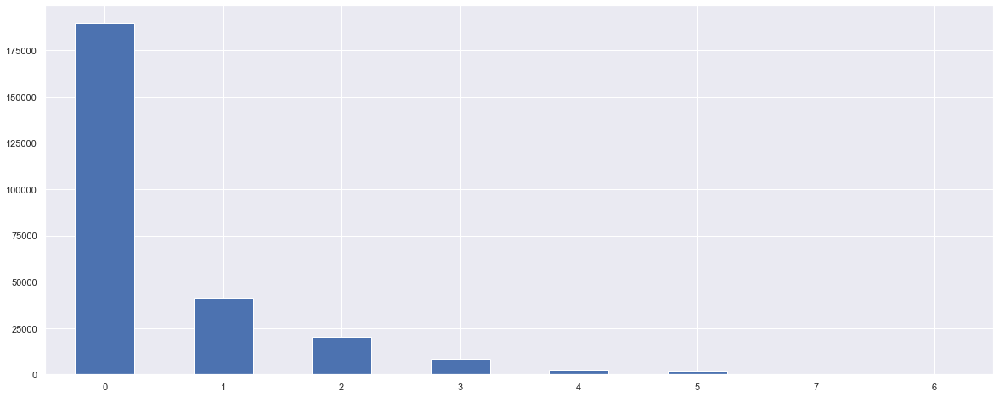

In [819]:
df_edges_new.options.value_counts().plot(kind="bar", rot=0, figsize=(20,8));

In [820]:
df_edges_new.head()

,source,target,title_topic,topic_title,weight,same_level,importance,topic_section,similarity,section_title,title_section,section_topic,options
0,геометрия моделей биотканей,моделирование,0,0,2,0,1.164,0,0.582,0,0,0,0
1,геометрия моделей биотканей,перенос излучения,0,0,2,0,0.782,0,0.391,0,0,0,0
2,геометрия моделей биотканей,сетевое взаимодействие,0,0,2,0,0.494,0,0.247,0,0,0,0
3,геометрия моделей биотканей,мутные среды,0,0,2,0,0.740,0,0.370,0,0,0,0
4,геометрия моделей биотканей,оптические и теплофизические параметры биотканей,0,0,2,0,1.004,0,0.502,0,0,0,0


In [822]:
df_edges_new["is_child_of"] = df_edges_new["topic_title"]+df_edges_new["topic_section"]+df_edges_new["section_title"]
df_edges_new["is_parent_of"] = df_edges_new["title_topic"]+df_edges_new["section_topic"]+df_edges_new["title_section"]
df_edges_new.sample(5)

,source,target,title_topic,topic_title,weight,same_level,importance,topic_section,similarity,section_title,title_section,section_topic,options,is_child_of,is_parent_of
22583,управление проектами,социальное действие,0,0,1,0,0.408,1,0.408,0,0,0,1,1,0
232366,it-инфраструктура предприятия,администрирование dns,0,0,2,0,0.796,0,0.398,0,0,0,0,0,0
3593,методы оптимизации,поиск глобального экстремума,1,0,2,0,0.856,0,0.428,0,0,1,2,0,2
112577,кодирование на основе линейного предсказания,скалярное квантование,0,0,4,0,1.936,0,0.484,0,0,0,0,0,0
186064,сфера информационной безопасности,методы выполнения экспертной оценки трудноформ...,0,0,4,0,1.532,0,0.383,0,0,0,0,0,0


In [827]:
df_edges_new.to_csv("edges_similarity_update.csv")